In [1]:
import warnings
import pandas as pd
import numpy as np
import random
import seaborn as sns
import matplotlib.pyplot as plt

from os.path import join
from IPython import display

from scipy.spatial.distance import pdist

from sklearn.datasets import load_digits
from sklearn.datasets import make_blobs
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, homogeneity_completeness_v_measure 
from sklearn.metrics.cluster import adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, OPTICS, SpectralClustering, MiniBatchKMeans
from sklearn.cluster import AffinityPropagation, Birch
from sklearn.metrics.pairwise import euclidean_distances

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [2]:
DATA_PATH = "data"
plt.rcParams["figure.figsize"] = 12, 9
sns.set_style("whitegrid")
warnings.filterwarnings("ignore")

SEED = 111
random.seed(SEED)
np.random.seed(SEED)

http://scikit-learn.org/stable/modules/clustering.html

### Задание 1. Реализация Kmeans

5 баллов

В данном задании вам предстоит дописать код класса `MyKMeans`. Мы на простом примере увидим, как подбираются центры кластеров и научимся их визуализировать.

Сгенерируем простой набор данных, 400 объектов и 2 признака (чтобы все быстро работало и можно было легко нарисовать):

In [122]:
X, true_labels = make_blobs(400, 2, centers=[[0, 0], [-4, 0], [3.5, 3.5], [3.5, -2.0]])

Напишем функцию `visualize_clusters`, которая по данным и меткам кластеров будет рисовать их и разукрашивать:

In [123]:
def visualize_clusters(X, labels):
    """
    Функция для визуализации кластеров
        :param X: таблица объекты х признаки
        :param labels: np.array[n_samples] - номера кластеров
    """
    
    unique_labels = np.sort(np.unique(labels))
    sns.scatterplot(X[:, 0], X[:, 1], hue=labels, 
                    palette="colorblind", legend=False,
                    hue_order=unique_labels)
    plt.xlabel("$X_1$", fontsize=18)
    plt.ylabel("$X_2$", fontsize=18)
    
    for label in labels:
        center = X[(labels == label)].mean(axis=0)
        plt.scatter(center[0], center[1], s=80, c="#201F12", marker=(5, 2))

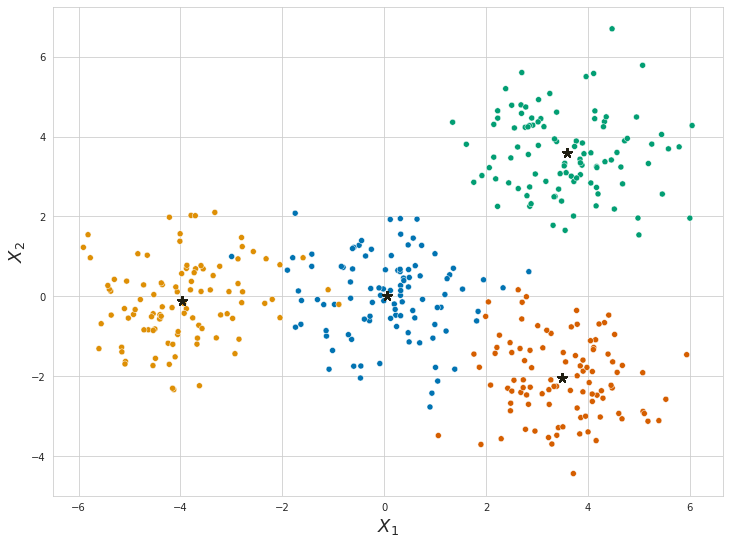

In [124]:
visualize_clusters(X, true_labels)

Напишем свой класс `MyKMeans`, который будет реализовывать алгоритм кластеризации K-средних. Напомним сам алгоритм:

1. Выбераем число кластеров (K)
2. Случайно инициализируем K точек (или выбираем из данных), это будут начальные центры наших кластеров
3. Далее для каждого объекта считаем расстояние до всех кластеров и присваиваем ему метку ближайщего
4. Далее для каждого кластера считаем "центр масс" (среднее значение для каждого признака по всем объектам кластера)
5. Этот "центр масс" становится новым центром кластера
6. Повторяем п.3, 4, 5 заданное число итераций или до сходимости

Во время предсказания алгоритм просто находит ближайщий центроид (центр кластера) для тестового объекта и возвращает его номер.

Реализуйте методы:
* `_calculate_distance(X, centroid)` - вычисляет Евклидово расстояние от всех объектов в `Х` до заданного центра кластера (`centroid`)
* `predict(X)` - для каждого элемента из `X` возвращает номер кластера, к которому относится данный элемент

In [125]:
class MyKMeans:
    def __init__(self, n_clusters, init="random", max_iter=300, visualize=False):
        """
        Конструктор класса MyKMeans
            :param n_clusters: число кластеров
            :param init: способ инициализации центров кластеров
                'random' - генерирует координаты случайно из нормального распределения
                'sample' - выбирает центроиды случайно из объектов выборки
            :param max_iter: заданное число итераций 
                (мы не будем реализовывать другой критерий остановки)
            :param visualize: рисовать ли кластеры и их центроиды в процессе работы
                код будет работать сильно дольше, но красиво...
        """
        
        assert init in ["random", "sample"], f"Неизвестный метод инициализации {init}"
        self.n_clusters = n_clusters
        self.init = init
        self.max_iter = max_iter
        self.centroids = None
        self.visualize = visualize
       
    
    def fit(self, X):
        """
        Подбирает оптимальные центры кластеров
            :param X: наши данные (n_samples, n_features)
        :return self: все как в sklearn
        """
        
        n_samples, n_features = X.shape
        
        # Инициализация центров кластеров
        if self.init == "random":
            centroids = np.random.randn(self.n_clusters, n_features)
        elif self.init == "sample":
            centroids_idx = np.random.choice(np.arange(n_samples), 
                                             size=self.n_clusters, 
                                             replace=False)
            centroids = X[centroids_idx]
        
        # Итеративно двигаем центры
        for i in range(self.max_iter):
            # Посчитаем расстояния для всех объектов до каждого центроида
            dists = []
            for centroid in centroids:
                dists.append(self._calculate_distance(X, centroid))
            dists = np.concatenate(dists, axis=1)
            # Для каждого объекта найдем, к какому центроиду он ближе
            cluster_labels = np.argmin(dists, axis=1)
            
            # Пересчитаем центр масс для каждого кластера
            centroids = []
            for label in np.sort(np.unique(cluster_labels)):
                center = X[(cluster_labels == label)].mean(axis=0)
                centroids.append(center)
            
            # Отрисуем точки, покрасим по меткам кластера, а также изобразим центроиды
            if self.visualize:
                visualize_clusters(X, cluster_labels)
                display.clear_output(wait=True)
                display.display(plt.gcf())
                plt.close()
            
            # сколько итераций нужно?            
            if i == 0:
                i_rand = adjusted_rand_score(true_labels, cluster_labels)
                i_mutual = adjusted_mutual_info_score(true_labels, cluster_labels)
                round_rand = None
                round_mutual = None
                continue

            adrscore = round(adjusted_rand_score(true_labels, cluster_labels), 6)
            
            if i_rand < adrscore:
                i_rand = adrscore
                    
            elif i_rand == adrscore and not round_rand:
                round_rand = i
            
            admscore = round(adjusted_mutual_info_score(true_labels, cluster_labels), 6)

            if i_mutual < admscore:
                i_mutual = admscore
                
            elif i_mutual == admscore and not round_mutual:
                round_mutual = i

        self.centroids = np.array(centroids)
        
        
        print(f'{round_rand=}')
        print(f'{round_mutual=}')
        
        return self
    
    
    def predict(self, X):
        """
        Для каждого X возвращает номер кластера, к которому он относится
            :param X: наши данные (n_samples, n_features)
        :return cluster_labels: метки кластеров
        """
        dists = []
        for centroid in self.centroids:
            dists.append(self._calculate_distance(X, centroid))
        dists = np.concatenate(dists, axis=1)

        cluster_labels = np.argmin(dists, axis=1)  
        return cluster_labels


    def _calculate_distance(self, X, centroid):
        """
        Вычисляет Евклидово расстояние от всех объектов в Х до заданного центра кластера (centroid)
            :param X: наши данные (n_samples, n_features)
            :param centroid: координаты центра кластера
        :return dist: расстояния от всех X до центра кластера
        """
        
        dist = euclidean_distances(X, centroid.reshape(1, -1))
        return dist
    
    
    def __repr__(self):
        return f"Привет, я твой KMeans (/¯◡ ‿ ◡)/¯☆*"

Обучите `MyKMeans` на наших игручешных данных, добейтесь сходимости. Не забудьте поставить `visualize=True`, чтобы посмотреть на красивые картинки. Также попробуйте различные способы инициализации центроидов и скажите, какой лучше подошел в этой ситуации.

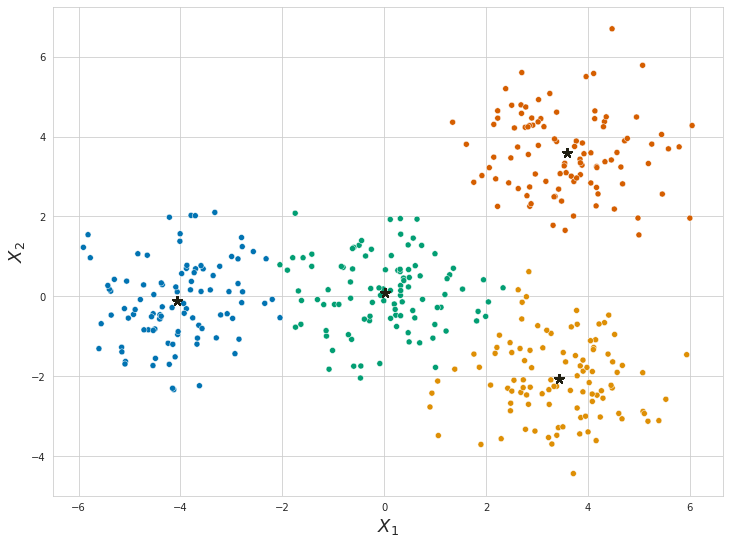

round_rand=None
round_mutual=None
silhouette_score: 0.56932
adjusted_rand_score: 0.92253
adjusted_mutual_info_score: 0.90536


In [126]:
my_kmeans_model = MyKMeans(n_clusters=4, visualize=True, max_iter=15)
my_kmeans_model.fit(X)
labels_pred = my_kmeans_model.predict(X)

print(f'silhouette_score: {round(silhouette_score(X, labels_pred), 5)}')
print(f'adjusted_rand_score: {round(adjusted_rand_score(true_labels, labels_pred), 5)}')
print(f'adjusted_mutual_info_score: {round(adjusted_mutual_info_score(true_labels, labels_pred), 5)}')

In [163]:
my_kmeans_model = MyKMeans(n_clusters=4)
my_kmeans_model.fit(X)
labels_pred = my_kmeans_model.predict(X)

round_rand=7
round_mutual=7


In [164]:
print(f'silhouette_score: {round(silhouette_score(X, labels_pred), 5)}')
print(f'adjusted_rand_score: {round(adjusted_rand_score(true_labels, labels_pred), 5)}')
print(f'adjusted_mutual_info_score: {round(adjusted_mutual_info_score(true_labels, labels_pred), 5)}')
print('homogeneity: {0:.4f}, completeness: {1:.4f}, v_measure: {2:.4f}'.format(*homogeneity_completeness_v_measure(true_labels, labels_pred)))

silhouette_score: 0.56885
adjusted_rand_score: 0.92884
adjusted_mutual_info_score: 0.91142
homogeneity: 0.9121, completeness: 0.9122, v_measure: 0.9121


In [177]:
my_kmeans_model = MyKMeans(n_clusters=4, init="sample")
my_kmeans_model.fit(X)
labels_pred = my_kmeans_model.predict(X)

round_rand=15
round_mutual=15


In [178]:
print(f'silhouette_score: {round(silhouette_score(X, labels_pred), 5)}')
print(f'adjusted_rand_score: {round(adjusted_rand_score(true_labels, labels_pred), 5)}')
print(f'adjusted_mutual_info_score: {round(adjusted_mutual_info_score(true_labels, labels_pred), 5)}')
print('homogeneity: {0:.4f}, completeness: {1:.4f}, v_measure: {2:.4f}'.format(*homogeneity_completeness_v_measure(true_labels, labels_pred)))

silhouette_score: 0.56885
adjusted_rand_score: 0.92884
adjusted_mutual_info_score: 0.91142
homogeneity: 0.9121, completeness: 0.9122, v_measure: 0.9121


На таких данных нет разницы какой способ инициализации центроидов использовать в конечном итоге, по скорости достижения "лучшего" положения центроидов, случайная инициализация также дает примерно одинаковые результаты с 'sample' (иногда лучше 'sample', иногда 'random'.

### Задание 2. Подбираем лучшую иерархическую кластеризацию

5 баллов

На лекции были рассмотрены различные расстояния, которые могут служить метриками различия между объектами. Также мы разобрали несколько алгоритмов кластеризации, в том числе и иерархическую. Часто может быть непонятно, какой алгоритм и какую метрику расстояния нужно взять. Давайте упростим себе жизнь и напишем функцию `algorithm_selection`, которая будет на основании переданных ей:

* метрик расстояния (можно брать все, что было на лекциях, минимум 4)
* параметра `linkage` ('average', 'single', 'complete')
* и метрик качества кластеризации ('Homogeneity', 'Completeness', 'V-measure', 'Silhouette')

будет выводить итоговую таблицу, в которую войдут столбцы:
* distance (метрика расстояния)
* linkage (алгоритм иерархической кластеризации)
* homogenity
* completeness
* v_measure
* silhouette

В результате по этой таблице, нужно сделать вывод о том, какой алгоритм кластеризации и с какими гиперпараметрами лучше всего сработал.

Загрузим наши данные:

In [179]:
data = load_digits()
X, y = data.data, data.target

Работать будем с изображениями рукописных цифр. Тут все похоже на данные для 1 домашнего задания, каждая картинка представлена вектором из 64 элементов (числа от 0 до 255). Чтобы ее нарисовать мы должны сделать `reshape` в картинку 8 на 8 пикселей.

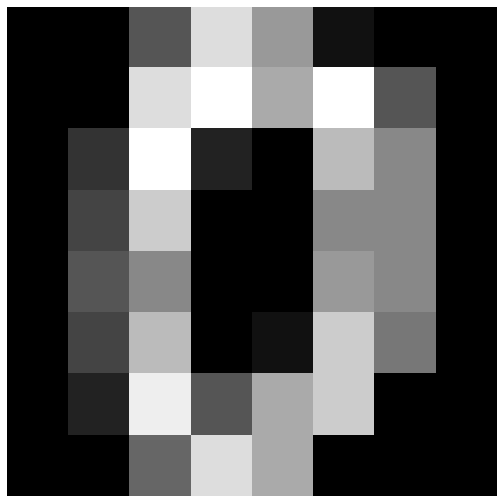

In [188]:
plt.imshow(X[0].reshape(8, 8).astype(int), cmap="gray")
plt.axis("off");

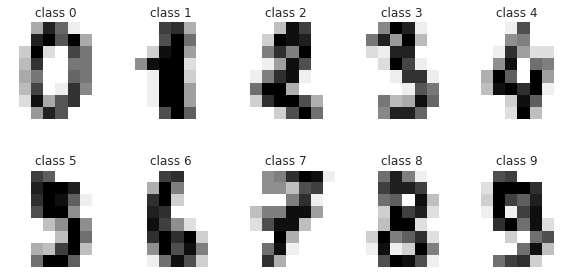

In [187]:
plotted = set()
plt.figure(figsize = (10, 5))

for j, group in enumerate(y):
    i = int(group)
    if i not in plotted:
        plt.subplot(2, 5, i + 1)
        plt.imshow(X[j].reshape(8, 8).astype(int), cmap = "gray_r")
        plt.title(f'class {i}')
        plt.axis('off')
        
        plotted.add(i)
            

In [189]:
print(X.shape, y.shape)

df_describe = pd.DataFrame(y)
df_describe.value_counts()

(1797, 64) (1797,)


3    183
1    182
5    182
4    181
6    181
9    180
7    179
0    178
2    177
8    174
dtype: int64

##### YOUR TURN TO CODE

In [280]:
def affinity_distance(X, metric):
    return pdist(X, metric=metric)
    

def algorithm_selection(X, distances, algorithms, metrics):
    """
    Для заданных алгоримов кластеризации и гиперпараметров 
    считает различные метрики кластеризации
        :param X: наши данные (n_samples, n_features)
        :param distances: список возможных метрик расстояния ('euclidean', 'manhattan', 'cosine', 'chebyshev', 'canberra') 
        :param algorithm: параметр linkage ('average', 'single', 'complete')
        :param metrics: список метрик качества кластеризации (silhouette_score, homogeneity_completeness_v_measure)
    :return compare_dataframe: таблица с метриками кластеризации
    """

    column_names = ['distance', 'linkage', 'homogenity', 'completeness', 'v_measure', 'silhouette']
    compare_dataframe = pd.DataFrame(columns = column_names)
    
    for distance in distances:
        for alg in algorithms:
            
            if distance not in ['euclidean', 'manhattan', 'cosine']:
                cluster = AgglomerativeClustering(n_clusters=10, affinity='precomputed', linkage=alg)
                affinity_distance = pairwise_distances(X, metric=distance)
                y_pred = cluster.fit_predict(affinity_distance)
            
            else:
                y_pred = AgglomerativeClustering(n_clusters=10, affinity=distance, linkage=alg).fit_predict(X)
            
            homogeneity, completeness, v_measure = metrics[1](y, y_pred)
            new_row = [distance, alg, homogeneity, completeness, v_measure, metrics[0](X, y_pred)]
            
            compare_dataframe = compare_dataframe.append(pd.Series(new_row, 
                                                                   index = compare_dataframe.columns), 
                                                         ignore_index=True)
    return compare_dataframe


In [ ]:
from scipy.spatial.distance: [‘braycurtis’, ‘canberra’, ‘chebyshev’, ‘correlation’, 
                              ‘dice’, ‘hamming’, ‘jaccard’, ‘kulsinski’, ‘mahalanobis’, 
                              ‘minkowski’, ‘rogerstanimoto’, ‘russellrao’, ‘seuclidean’, 
                              ‘sokalmichener’, ‘sokalsneath’, ‘sqeuclidean’, ‘yule’]

In [281]:
distances = ['euclidean', 'manhattan', 'cosine', 'chebyshev', 'canberra']
algorithms = ['average', 'single', 'complete']
metrics = [silhouette_score, homogeneity_completeness_v_measure]

In [283]:
result_df = algorithm_selection(X, distances, algorithms, metrics)
result_df

,distance,linkage,homogenity,completeness,v_measure,silhouette
0,euclidean,average,0.655393,0.782342,0.713263,0.146625
1,euclidean,single,0.005056,0.273755,0.009929,-0.133621
2,euclidean,complete,0.590549,0.637772,0.613253,0.119271
3,manhattan,average,0.566751,0.778942,0.656117,0.089217
4,manhattan,single,0.005102,0.276237,0.010019,-0.166627
5,manhattan,complete,0.646372,0.686109,0.665648,0.140183
6,cosine,average,0.648268,0.808762,0.719676,0.129526
7,cosine,single,0.00505,0.273389,0.009916,-0.15825
8,cosine,complete,0.528727,0.577415,0.551999,0.088021
9,chebyshev,average,0.769464,0.828645,0.797959,0.1739


In [288]:
result_df.sort_values(by=['v_measure'], ascending=False)

,distance,linkage,homogenity,completeness,v_measure,silhouette
9,chebyshev,average,0.769464,0.828645,0.797959,0.1739
6,cosine,average,0.648268,0.808762,0.719676,0.129526
0,euclidean,average,0.655393,0.782342,0.713263,0.146625
5,manhattan,complete,0.646372,0.686109,0.665648,0.140183
12,canberra,average,0.57386,0.779789,0.661161,0.094335
3,manhattan,average,0.566751,0.778942,0.656117,0.089217
2,euclidean,complete,0.590549,0.637772,0.613253,0.119271
8,cosine,complete,0.528727,0.577415,0.551999,0.088021
14,canberra,complete,0.528702,0.561588,0.544649,0.099416
11,chebyshev,complete,0.067111,0.412582,0.115444,-0.193835


Из проверенных сочетаний distances и algorithms лучшие результаты даёт chebyshev distance при average linkage (правда silhouette не очень, но он все равно лучший из всех вариантов).

### Задание 3. Аннотация клеточных типов

суммарно 10 баллов

В этом задании вам предстоит применять полученные знания о кластеризации для аннотации данных, полученных при помощи проточной цитометрии. Каждая строка в данных это одна клетка, столбцы **FSC-A**, **SSC-A** косвенным образом свидетельствуют о размере клеток, остальные показывают интенсивность флуоресценции различных поверхностных маркеров. Ваша задача определить для каждой клетки, к какому типу она относится.

#### 3.1. EDA

1.5 балла

Проведите EDA:

1. Посмотрите на данные (можно попробовать метод `describe`)
2. Сколько у нас клеток / признаков
3. Постройте распределения каждого признака (есть ли очевинные выбросы?)

In [7]:
bfc_data = pd.read_csv(join('../data_folder', "flow_c_data.csv"), index_col=0)

##### YOUR TURN TO CODE:

In [8]:
bfc_data.head()

,FSC-A,SSC-A,HLA-DR,CD3,CD45,CD14,CD56,CD19,CD11c
0,0.722199,0.154232,0.494449,0.512853,4.057328,1.019255,4.007273,-1.406912,0.384406
1,0.751073,0.114618,4.671924,0.822042,4.933149,0.159388,-0.216407,6.034845,0.577039
2,1.108188,0.150011,-0.422857,4.006353,5.616384,0.519223,0.783077,-0.318668,-0.493832
3,0.553310,0.119929,0.345968,3.332310,5.260935,1.481229,0.264846,0.694883,3.416960
4,0.774884,0.076984,4.984963,0.885501,4.562367,0.217117,0.086279,5.563345,0.471591


In [10]:
bfc_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 0 to 9999
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   FSC-A   10000 non-null  float64
 1   SSC-A   10000 non-null  float64
 2   HLA-DR  10000 non-null  float64
 3   CD3     10000 non-null  float64
 4   CD45    10000 non-null  float64
 5   CD14    10000 non-null  float64
 6   CD56    10000 non-null  float64
 7   CD19    10000 non-null  float64
 8   CD11c   10000 non-null  float64
dtypes: float64(9)
memory usage: 781.2 KB


In [11]:
bfc_data.describe()

,FSC-A,SSC-A,HLA-DR,CD3,CD45,CD14,CD56,CD19,CD11c
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.962458,0.165415,1.791579,3.280391,5.169845,1.097182,0.412223,1.219683,0.569898
std,0.500012,0.190773,2.027281,2.112079,0.518247,1.375876,1.176967,2.285305,1.502445
min,0.144786,0.021657,-7.634172,-2.517639,-8.329666,-8.833883,-12.358701,-9.640775,-11.085437
25%,0.798804,0.105550,0.275056,1.401943,4.922227,0.389746,-0.195978,-0.146948,-0.498781
50%,0.908574,0.130543,1.194313,4.373660,5.234119,0.672853,0.053267,0.244121,0.272297
75%,1.052034,0.162536,3.696976,4.842212,5.481218,1.065076,0.378576,0.908374,1.220576
max,42.954485,15.460997,12.946668,13.844391,13.710922,6.294236,6.461899,7.208721,6.840864


<AxesSubplot:>

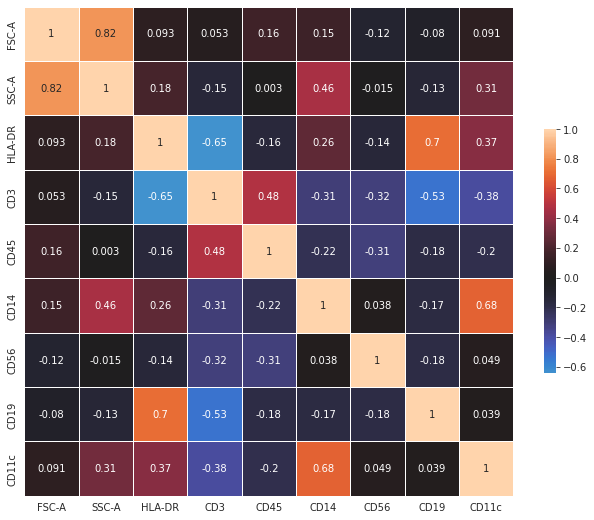

In [12]:
corr = bfc_data.corr()

f, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmax=1.0, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot = True)

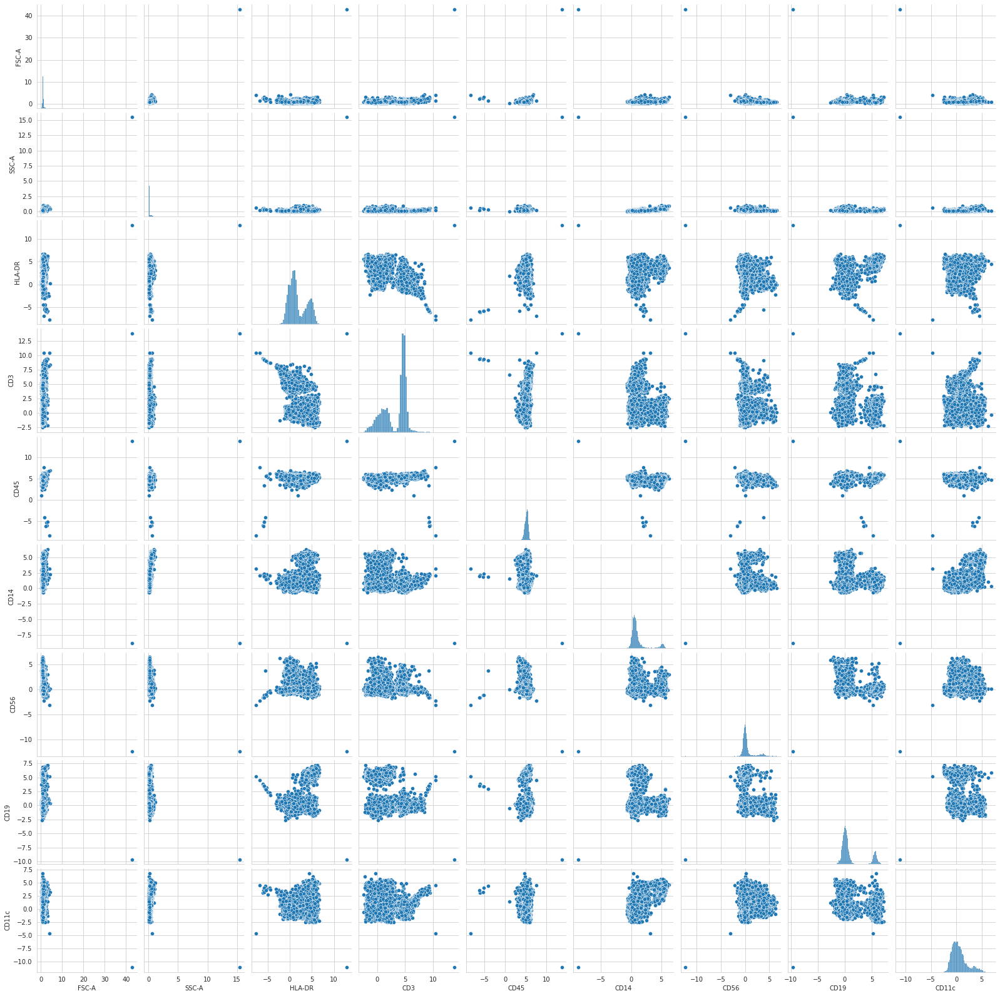

In [13]:
sns.pairplot(bfc_data)

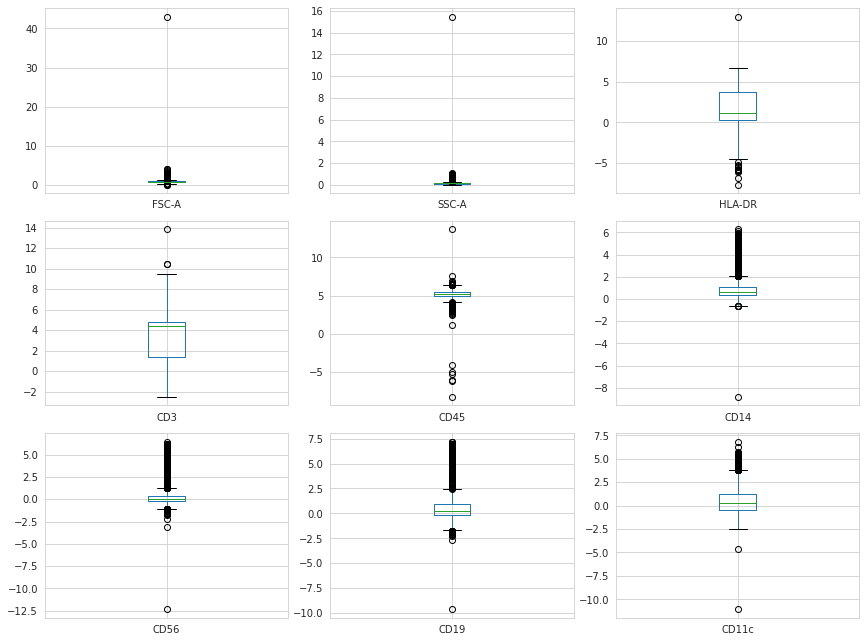

In [14]:
fig, axes = plt.subplots(3, 3)

for i, el in enumerate(list(fc_data.columns.values)):
    bfc_data.boxplot(el, ax=axes.flatten()[i])

plt.tight_layout() 

plt.show()

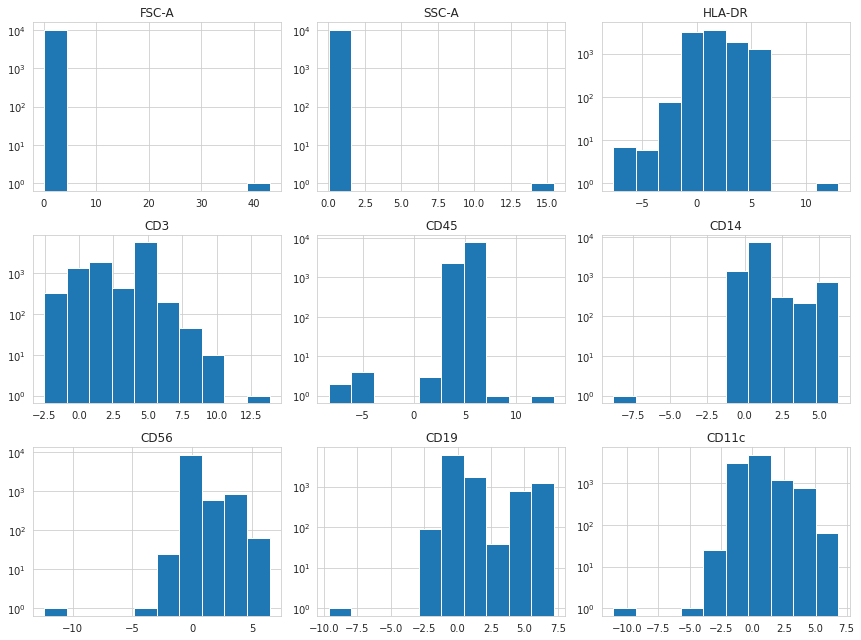

In [15]:
fig, axes = plt.subplots(3, 3)

for i, el in enumerate(list(fc_data.columns.values)):
    bfc_data.hist(el, ax=axes.flatten()[i], log=True)

plt.tight_layout() 

plt.show()

Очевидные выбросы есть в FSC-A и SSC-A. У других колонок согласно боксплоту тоже есть выбросы.

Не будем брать в кластеризацию строки с очевидными выбросами.

In [16]:
bfc_data[(bfc_data['FSC-A'] > 30) & (bfc_data['SSC-A'] > 14)]

,FSC-A,SSC-A,HLA-DR,CD3,CD45,CD14,CD56,CD19,CD11c
5843,42.954485,15.460997,12.946668,13.844391,13.710922,-8.833883,-12.358701,-9.640775,-11.085437


Выбросы в разных колонках - одно и тоже наблюдение.

In [17]:
bfc_data = bfc_data[(bfc_data['FSC-A'] < 30) & (fc_data['SSC-A'] < 14)]

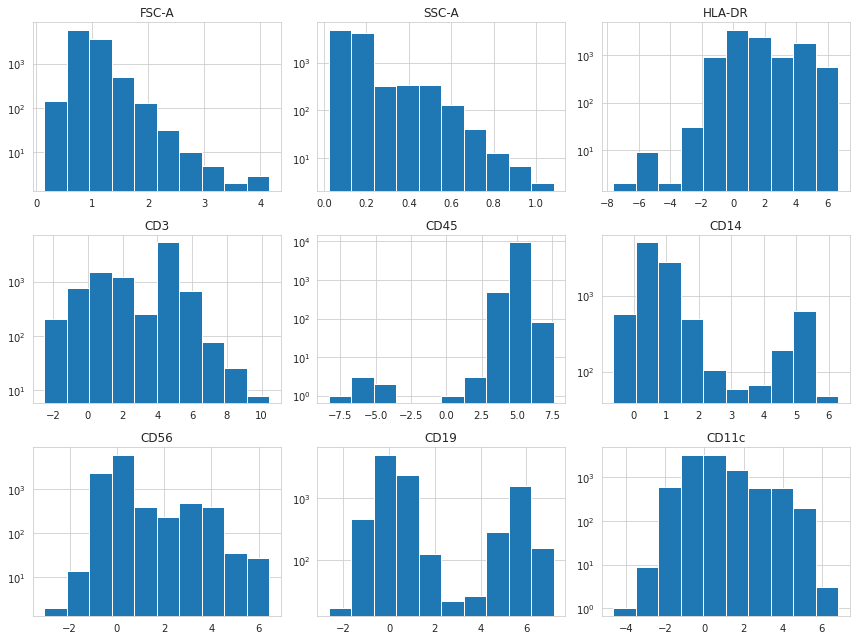

In [18]:
fig, axes = plt.subplots(3, 3)

for i, el in enumerate(list(bfc_data.columns.values)):
    bfc_data.hist(el, ax=axes.flatten()[i], log=True)

plt.tight_layout() 

plt.show()

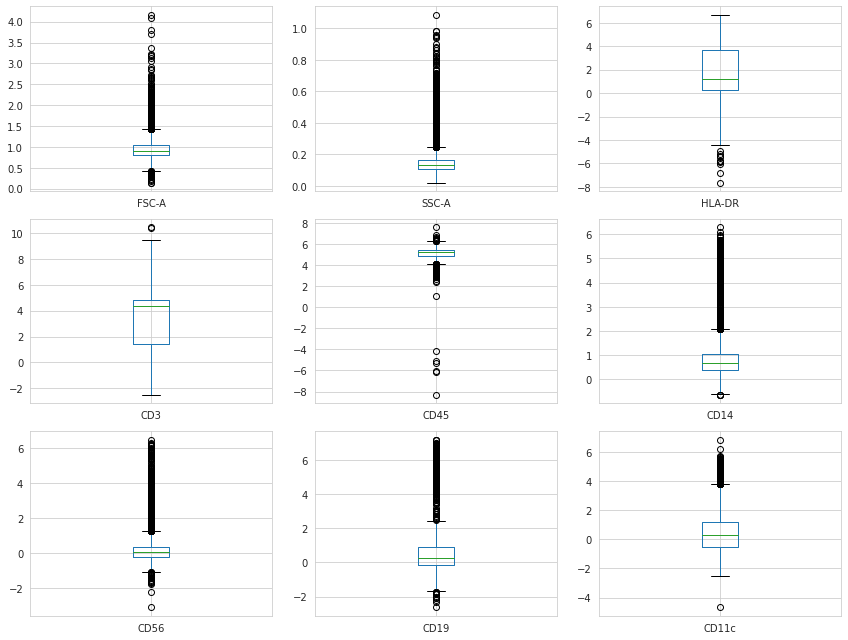

In [19]:
fig, axes = plt.subplots(3, 3)

for i, el in enumerate(list(bfc_data.columns.values)):
    bfc_data.boxplot(el, ax=axes.flatten()[i])

plt.tight_layout() 

plt.show()

<AxesSubplot:>

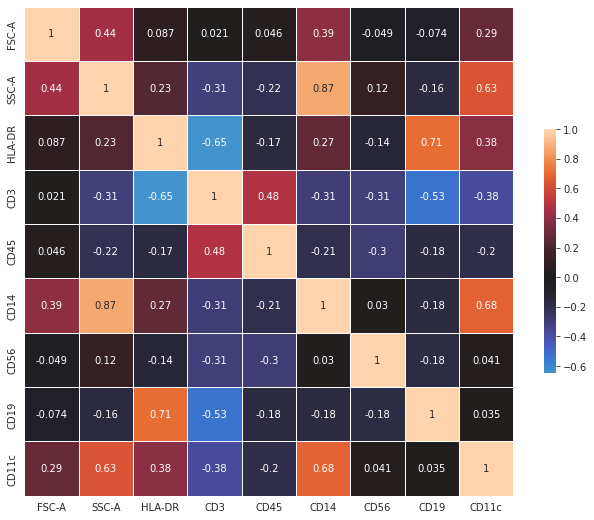

In [20]:
corr = bfc_data.corr()

f, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmax=1.0, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot = True)

Проведем стандартизацию наших данных:

In [6]:
scaler = StandardScaler()
fc_data[fc_data.columns] = scaler.fit_transform(fc_data)

#### 3.2. Кластеризация

4.5 балла

При ручной аннотации клеточных типов обычно поступают следующим образом:

1. При помощи методов понижения размерности рисуют наши наблюдения, чтобы примерно оценить число клеточных типов
2. Проводят кластеризацию наблюдений (для некоторых методов нужно заранее задать число кластеров, поэтому нам как раз помогает п.1)
3. Далее мы считаем, что клетки, которые алгоритм отнес к одному кластеру являются одним клеточным типом (если кластеров больше, чем типов клеток, то возможно, что 2 разных кластера являются одним типом)
4. После чего по интенсивности экспрессии поверхностных маркеров мы присваиваем кластеру клеточный тип

Давайте для начала напишем удобную функцию для визуализации наших многомерных данных в пространстве размерностью 2, делать мы это будем при помощи алгоритма t-SNE.

Поиграться с красивой визуализацией можно [тут](https://distill.pub/2016/misread-tsne/).

In [39]:
def plot_tsne(data, n_iter=1000, 
              perplexity=40, color=None):
    """
    Функция для отрисовки результатов работы t-SNE
        :param data: таблица объекты х признаки
        :param n_iter: число итераций градиентного спуска,
            может быть полезно увеличить, чтобы получить результаты получше
        :param perplexity: 
        :param color: np.array[n_samples] с переменной,
            которой мы хотим покрасить наши наблюдения
        :return tsne_emb: np.array[n_samples, 2] - результаты работы t-SNE
    """
    
    # Сначала сделаем PCA, так как это хорошее начальное приближение для t-SNE
    # позволит алгоритму быстрее сойтись
    pca = PCA().fit(data)
    pca_embedding = pca.transform(data)
    
    # Запустим t-SNE, он выдаст нам для каждого объекта по 2 числа, 
    # которые мы сможем нарисовать
    tnse = TSNE(n_components=2, init=pca_embedding[:, :2], n_jobs=-1,
                n_iter=n_iter, perplexity=perplexity)
    tsne_embedding = tnse.fit_transform(pca_embedding)
    
    plt.close()
    
    sns.scatterplot(x=tsne_embedding[:, 0],
                    y=tsne_embedding[:, 1],
                    hue=color, palette="colorblind")
    plt.xlabel("$TSNE_1$", fontsize=18)
    plt.ylabel("$TSNE_2$", fontsize=18)
    
    # Вернем также результаты t-SNE, так как, если потом захотим перестроить картинку,
    # в таком случае нам не придется ждать заново, просто нарисуем новую с готовыми данными
    
    return tsne_embedding

<IPython.core.display.Javascript object>


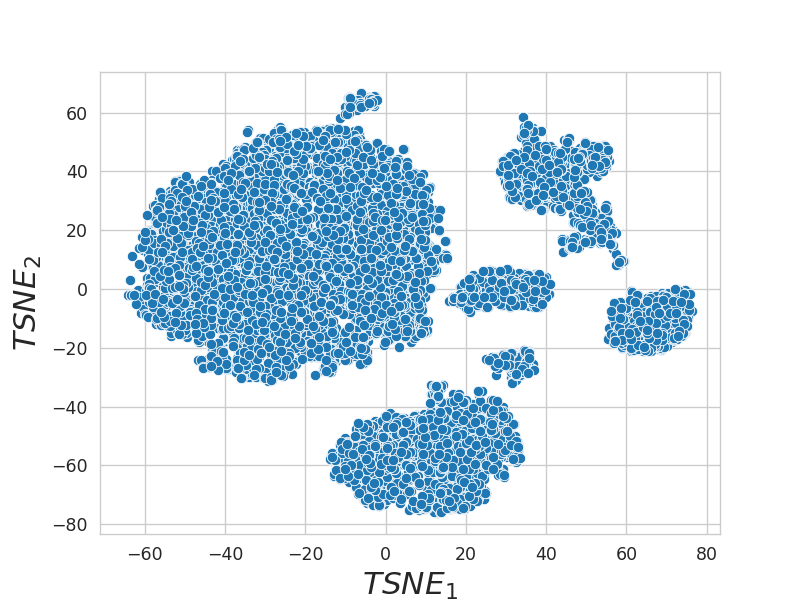

In [40]:
tsne_res = plot_tsne(fc_data)

In [41]:
def plot_2d(labels):
    
    sns.scatterplot(x=tsne_res[:, 0],
                    y=tsne_res[:, 1],
                    hue=labels, palette="colorblind")
    plt.xlabel("$TSNE_1$", fontsize=18)
    plt.ylabel("$TSNE_2$", fontsize=18)

In [42]:
def plot_3d_tsne(data, n_iter=1000, 
               perplexity=40, color=None):
    """
    Функция для отрисовки результатов работы t-SNE в 3D
        :param data: таблица объекты х признаки
        :param n_iter: число итераций градиентного спуска,
            может быть полезно увеличить, чтобы получить результаты получше
        :param perplexity: 
        :param color: np.array[n_samples] с переменной,
            которой мы хотим покрасить наши наблюдения
        :return tsne_emb: np.array[n_samples, 3] - результаты работы t-SNE
    """
    
    # Сначала сделаем PCA, так как это хорошее начальное приближение для t-SNE
    # позволит алгоритму быстрее сойтись
    pca = PCA().fit(data)
    pca_embedding = pca.transform(data)
    
    # Запустим t-SNE, он выдаст нам для каждого объекта по 2 числа, 
    # которые мы сможем нарисовать
    tnse = TSNE(n_components=3, init=pca_embedding[:, :3], n_jobs=-1,
                n_iter=n_iter, perplexity=perplexity)
    tsne_embedding = tnse.fit_transform(pca_embedding)
    
    # Вернем также результаты t-SNE, так как, если потом захотим перестроить картинку,
    # в таком случае нам не придется ждать заново, просто нарисуем новую с готовыми данными
    
    return tsne_embedding


In [43]:
tsne_3d_res = plot_3d_tsne(fc_data)

In [44]:
%matplotlib notebook

In [45]:
def plot_3D(labels='blue'):
    plt.close()  

    fig = plt.figure(figsize=(7,7))
    ax = fig.add_subplot(projection='3d')
    g = ax.scatter3D(xs=tsne_3d_res[:, 0],
                     ys=tsne_3d_res[:, 1],
                     zs=tsne_3d_res[:, 2], 
                     c=labels, cmap="tab10")

    legend = ax.legend(*g.legend_elements(), title="Classes")
    ax.set_xlabel("$TSNE_1$", fontsize=18)
    ax.set_ylabel("$TSNE_2$", fontsize=18)
    ax.set_zlabel("$TSNE_3$", fontsize=18)


<IPython.core.display.Javascript object>


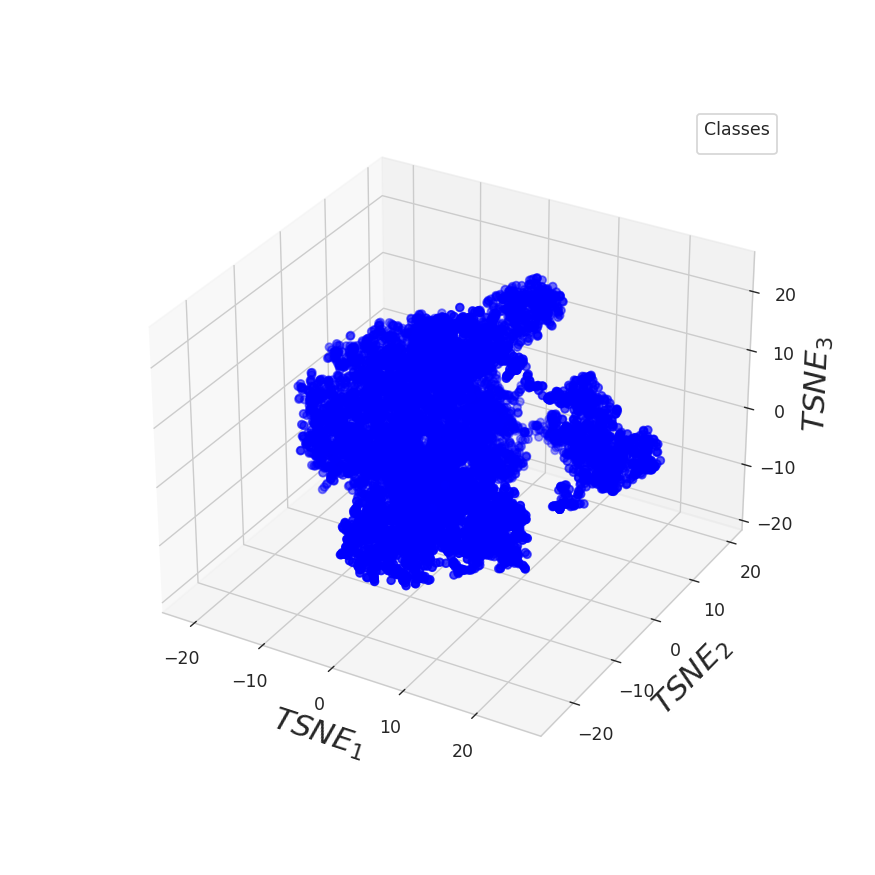

In [46]:
plot_3D()

Кластеризуйте ваши данные:

1. Попробуйте методы кластеризации из тех, что мы прошли

2. Выберите лучший на основании метрики `silhouette_score` (попробуйте также подобрать гиперпараметры)
3. Присвойте каждому наблюдению метку класса и нарисуйте график t-SNE, покрасив точки метками кластера

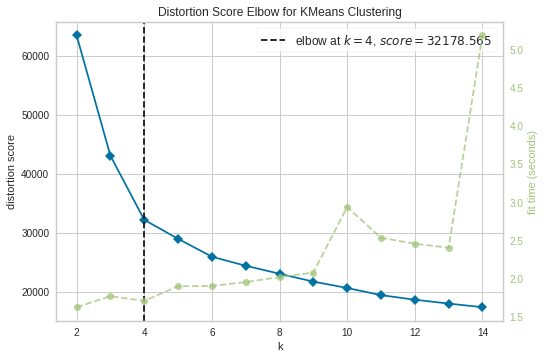

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [361]:
from yellowbrick.cluster import KElbowVisualizer

model = KMeans()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,15), timings= True)
visualizer.fit(fc_data)        # Fit data to visualizer
visualizer.show()        # Finalize and render figure

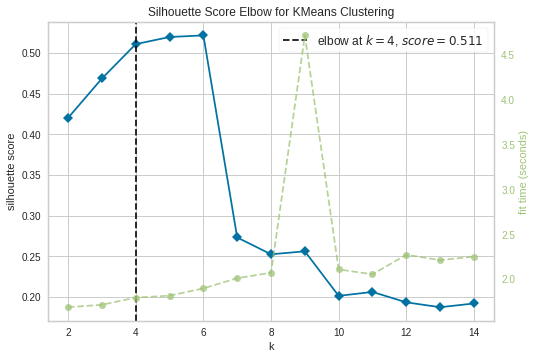

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [362]:
model = KMeans()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,15), metric='silhouette', timings= True)
visualizer.fit(fc_data)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

kmeans silhouette_score: 0.51107


<IPython.core.display.Javascript object>


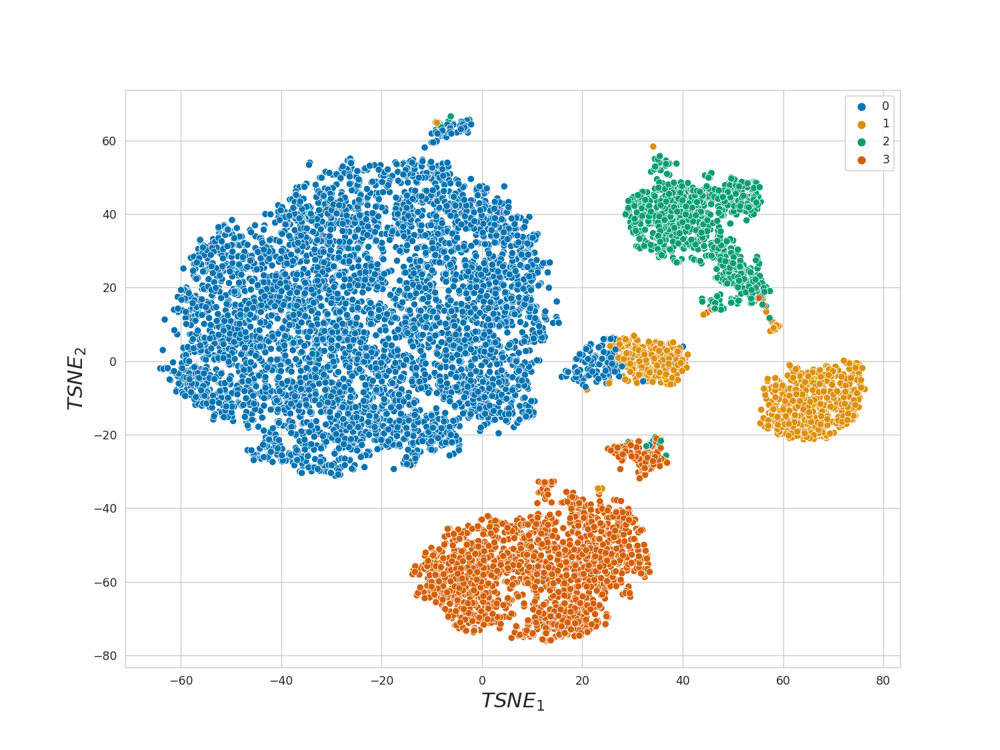

In [115]:
kmeans_labels = KMeans(n_clusters=4).fit_predict(fc_data)
print(f'kmeans silhouette_score: {round(silhouette_score(fc_data, kmeans_labels, metric="euclidean", random_state=0), 5)}')
plot_2d(kmeans_labels)

<IPython.core.display.Javascript object>


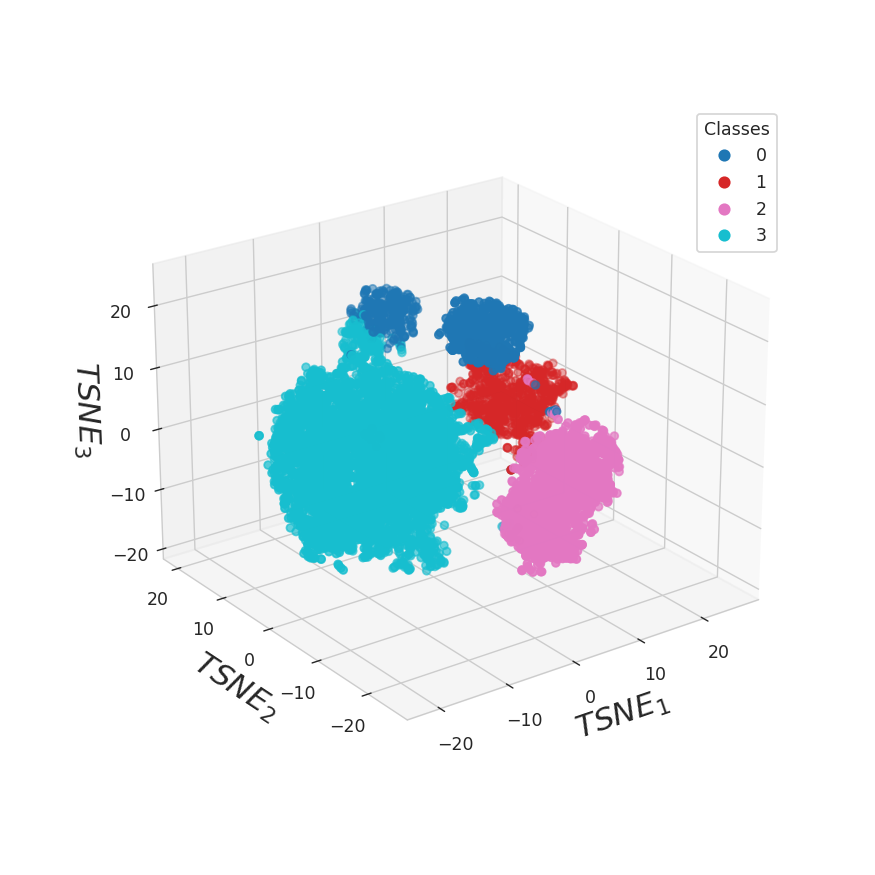

In [85]:
plot_3D(kmeans_labels)

Agglomerative (e, w) silhouette_score: 0.48086


<IPython.core.display.Javascript object>


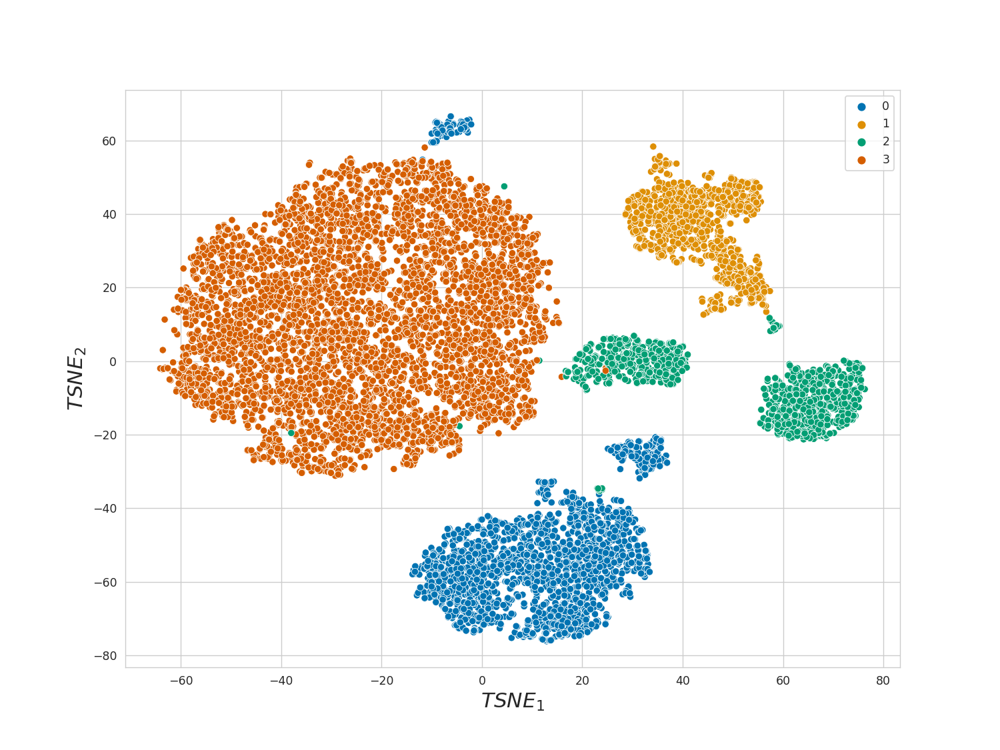

In [87]:
ag_ew_labels = AgglomerativeClustering(n_clusters=4).fit_predict(fc_data)
print(f'Agglomerative (e, w) silhouette_score: {round(silhouette_score(fc_data, ag_ew_labels, metric="euclidean", random_state=0), 5)}')

plot_2d(ag_ew_labels)

<IPython.core.display.Javascript object>


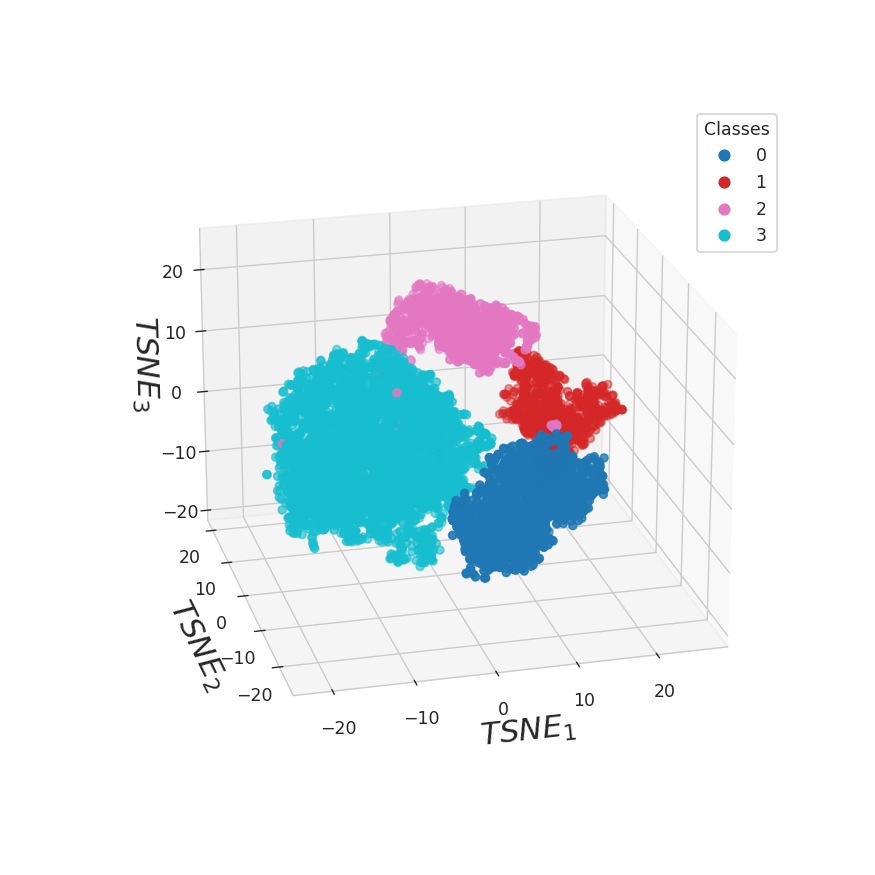

In [88]:
plot_3D(ag_ew_labels)

Agglomerative (c, a) silhouette_score: 0.61986


<IPython.core.display.Javascript object>


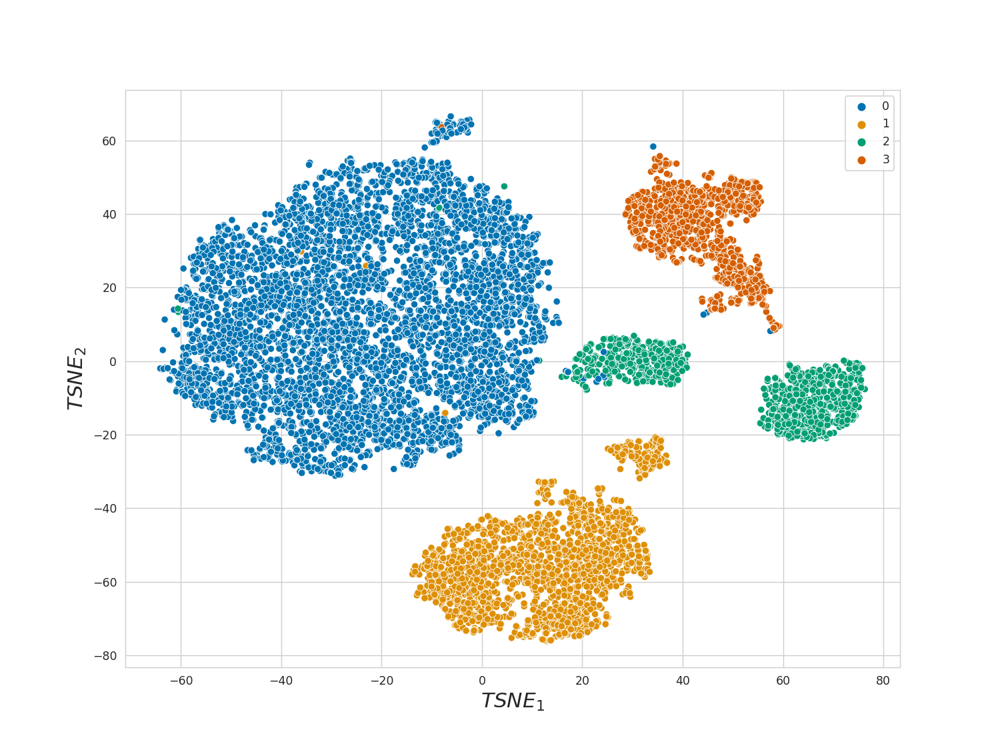

In [89]:
ag_ca_labels = AgglomerativeClustering(n_clusters=4, affinity='cosine', linkage='average').fit_predict(fc_data)
print(f'Agglomerative (c, a) silhouette_score: {round(silhouette_score(fc_data, ag_ca_labels, metric="cosine", random_state=0), 5)}')

plot_2d(ag_ca_labels)

<IPython.core.display.Javascript object>


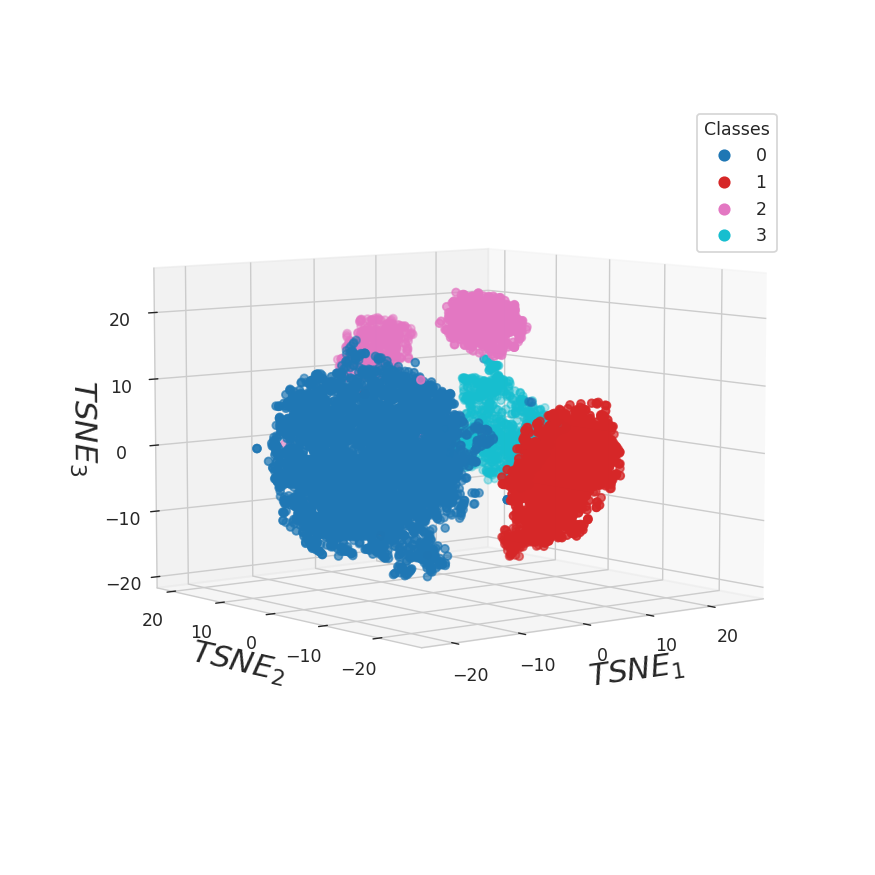

In [90]:
plot_3D(ag_ca_labels)

DBSCAN (c, b) silhouette_score: 0.38205


<IPython.core.display.Javascript object>


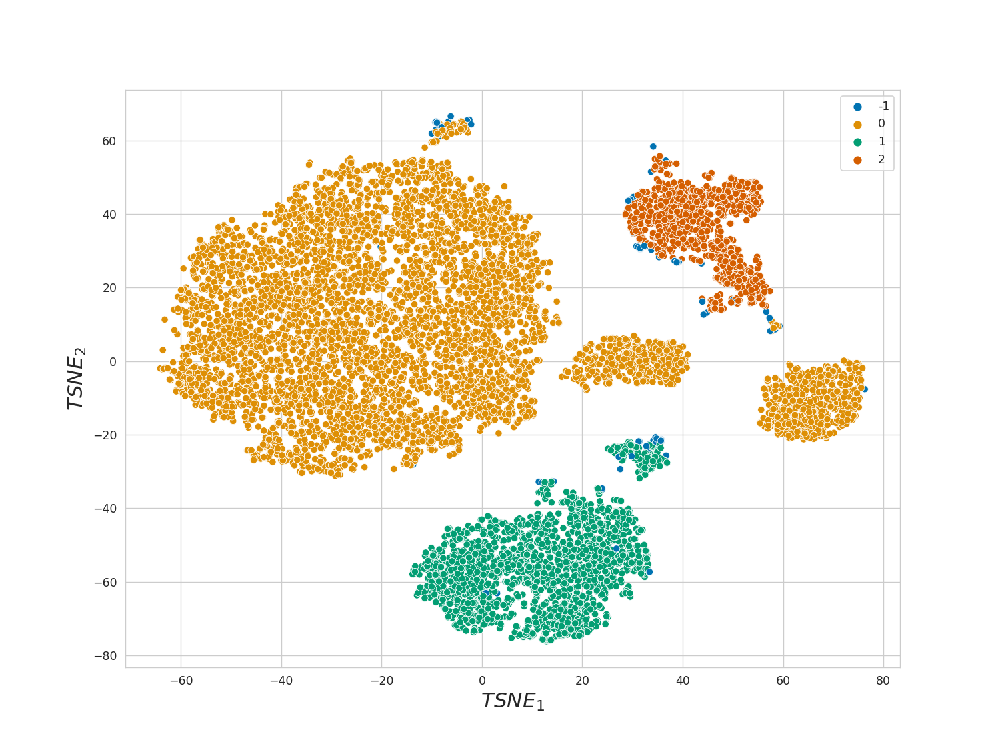

In [91]:
dbs_ca_labels = DBSCAN(eps=1.02, metric='chebyshev', algorithm='brute').fit_predict(fc_data)
print(f'DBSCAN (c, b) silhouette_score: {round(silhouette_score(fc_data, dbs_ca_labels, metric="chebyshev", random_state=0), 5)}')

plot_2d(dbs_ca_labels)

<IPython.core.display.Javascript object>


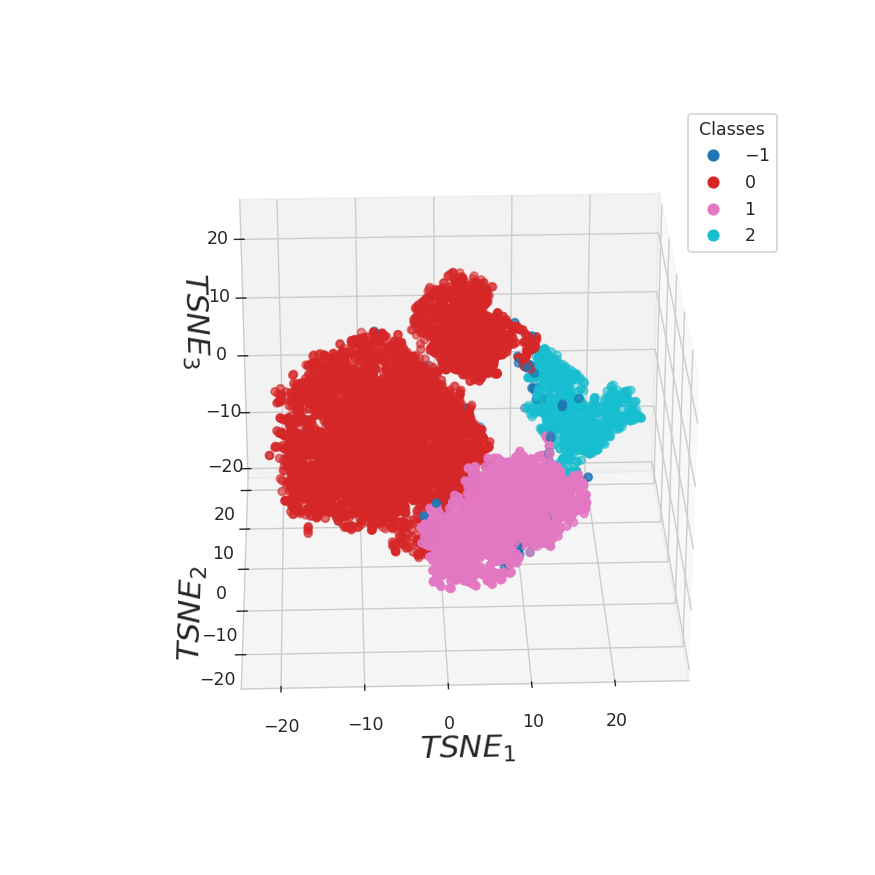

In [92]:
plot_3D(dbs_ca_labels)

DBSCAN (s, a) silhouette_score: 0.65771


<IPython.core.display.Javascript object>


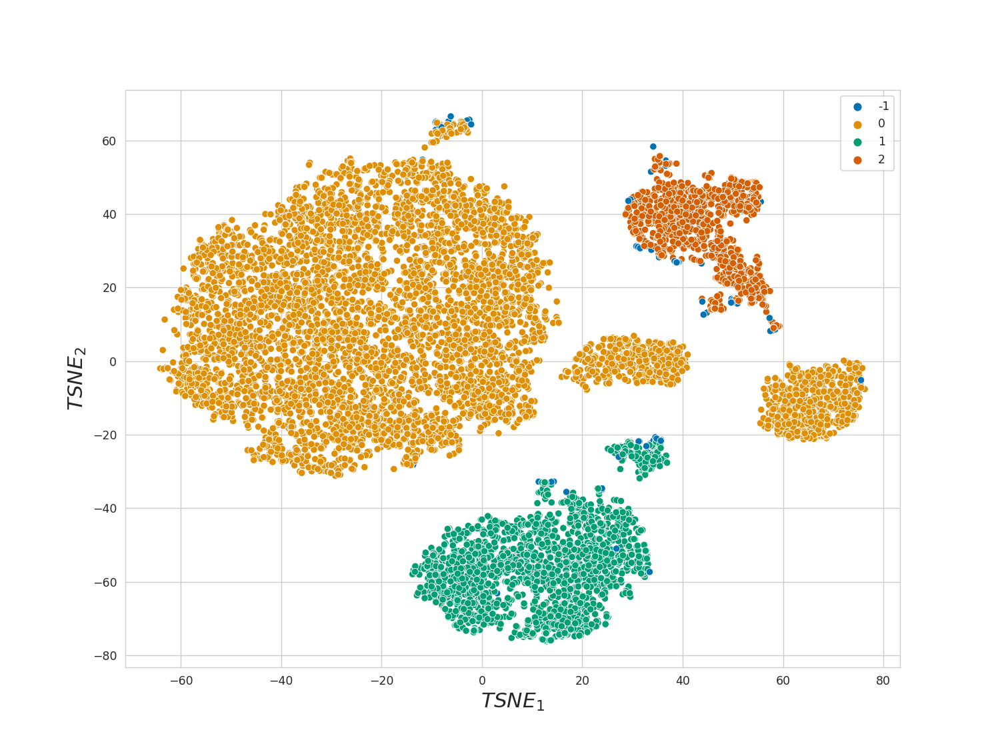

In [97]:
dbs_sa_labels = DBSCAN(eps=2.9, metric='sqeuclidean', algorithm='auto').fit_predict(fc_data)
print(f'DBSCAN (s, a) silhouette_score: {round(silhouette_score(fc_data, dbs_sa_labels, metric="sqeuclidean"), 5)}')

plot_2d(dbs_sa_labels)

<IPython.core.display.Javascript object>


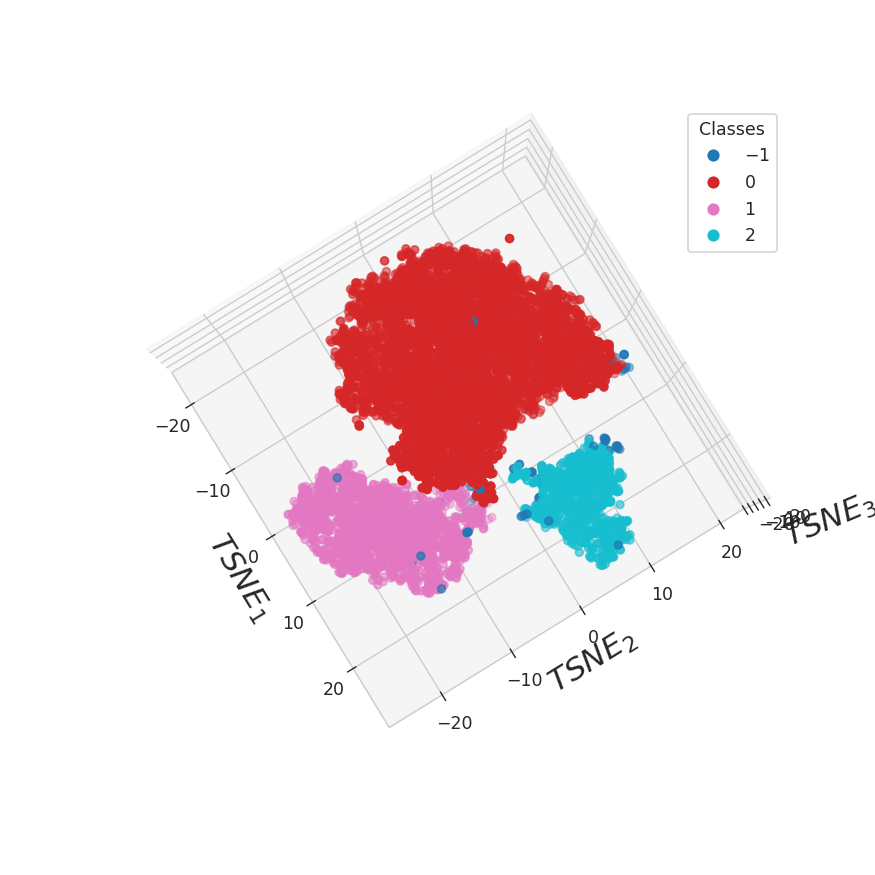

In [100]:
plot_3D(dbs_sa_labels)

OPTICS silhouette_score: 0.15533


<IPython.core.display.Javascript object>


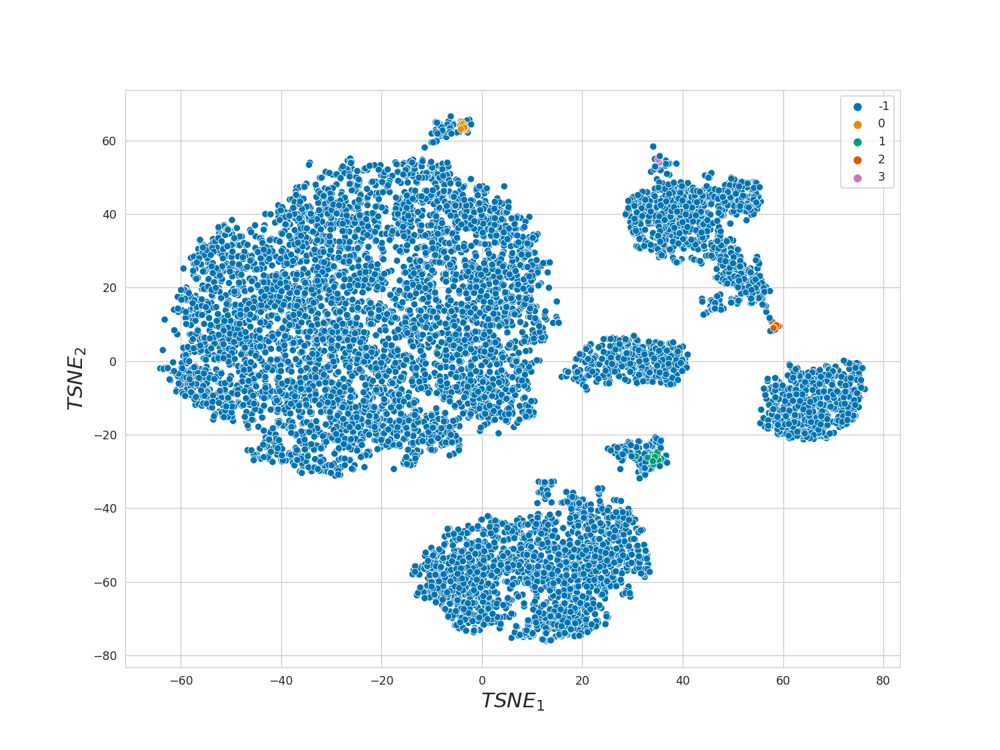

In [101]:
opt_labels = OPTICS(min_cluster_size=15, eps=3).fit_predict(fc_data)
print(f'OPTICS silhouette_score: {round(silhouette_score(fc_data, opt_labels), 5)}')

plot_2d(opt_labels)

<IPython.core.display.Javascript object>


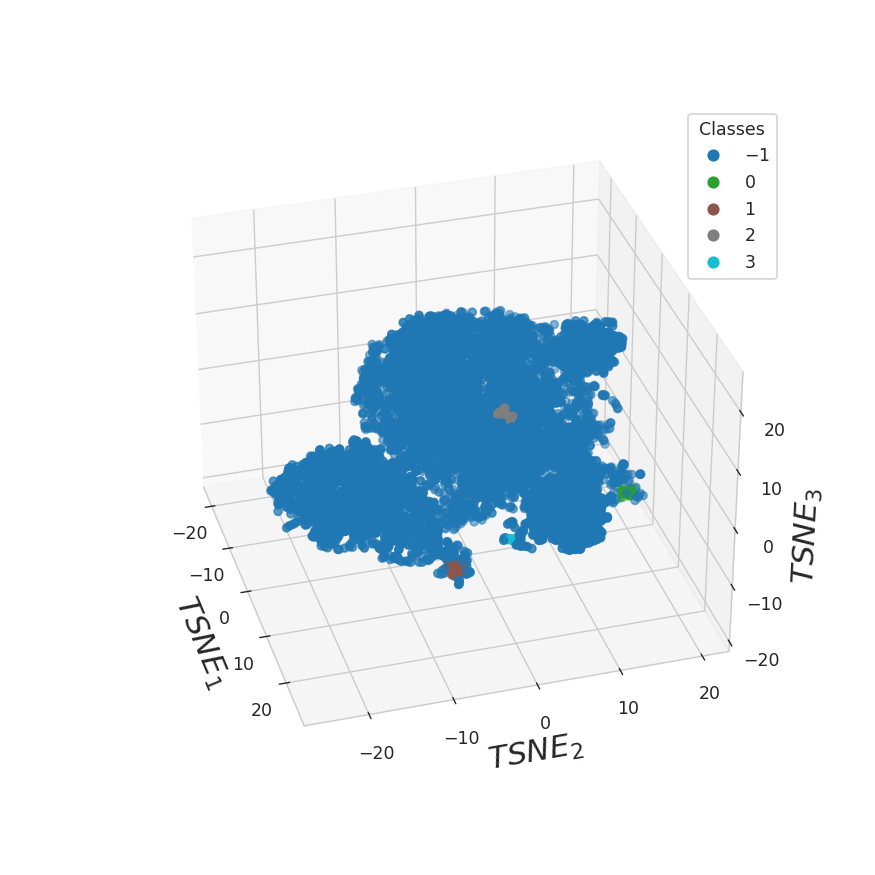

In [102]:
plot_3D(opt_labels)

SpectralClustering silhouette_score: 0.50603


<IPython.core.display.Javascript object>


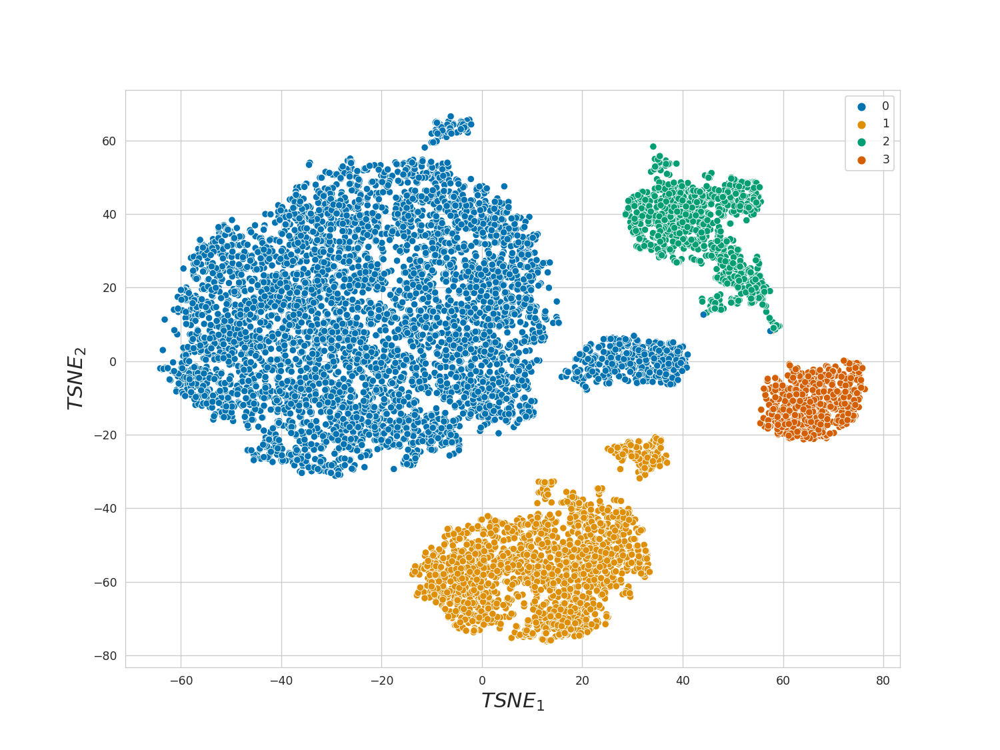

In [103]:
sc_labels = SpectralClustering(n_clusters=4, n_jobs=2, affinity='nearest_neighbors').fit_predict(fc_data)
print(f'SpectralClustering silhouette_score: {round(silhouette_score(fc_data, sc_labels), 5)}')

plot_2d(sc_labels)

<IPython.core.display.Javascript object>


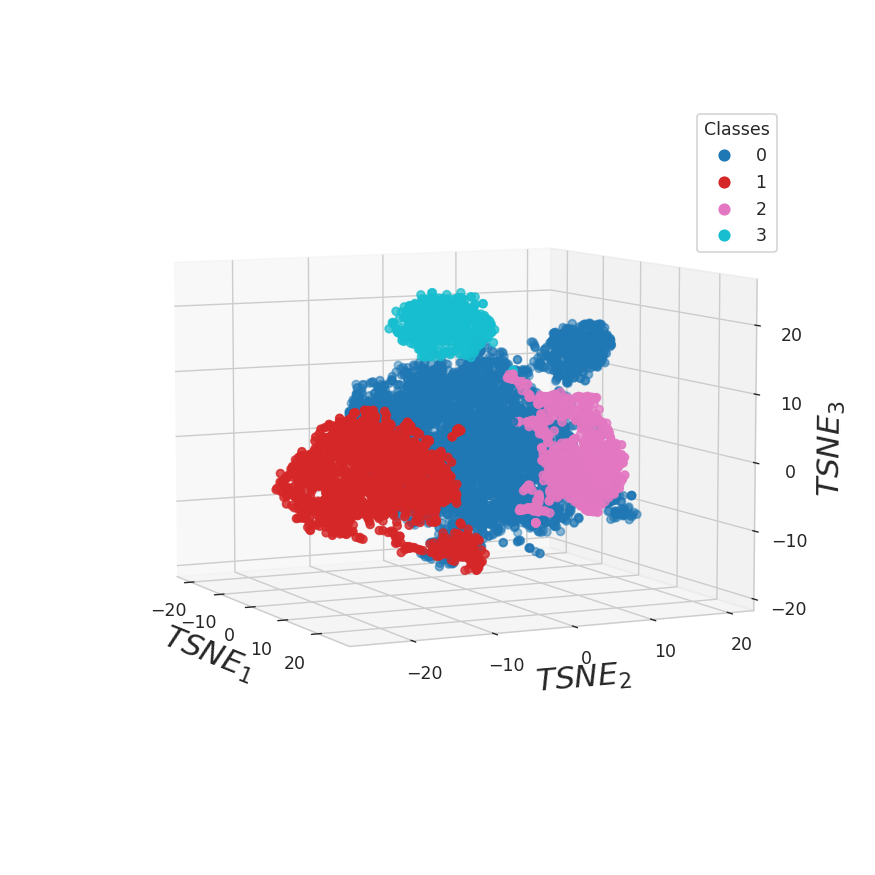

In [104]:
plot_3D(sc_labels)

MiniBatchKMeans silhouette_score: 0.43278


<IPython.core.display.Javascript object>


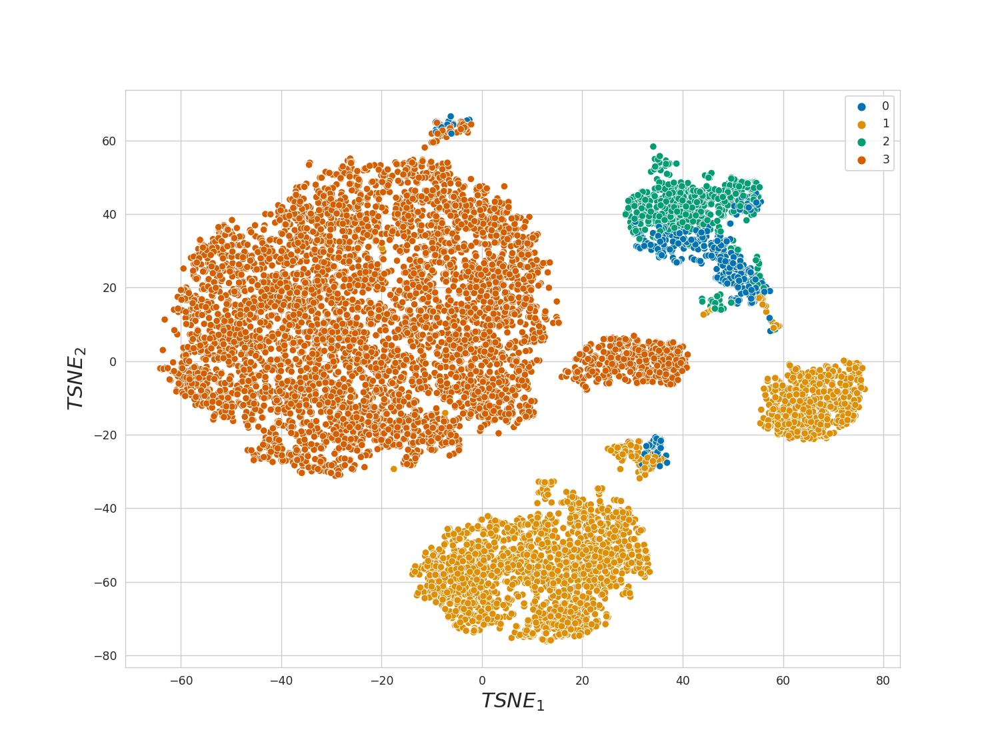

In [105]:
mbkm_labels = MiniBatchKMeans(n_clusters=4, init='random', random_state=SEED).fit_predict(fc_data)
print(f'MiniBatchKMeans silhouette_score: {round(silhouette_score(fc_data, mbkm_labels), 5)}')

plot_2d(mbkm_labels)

<IPython.core.display.Javascript object>


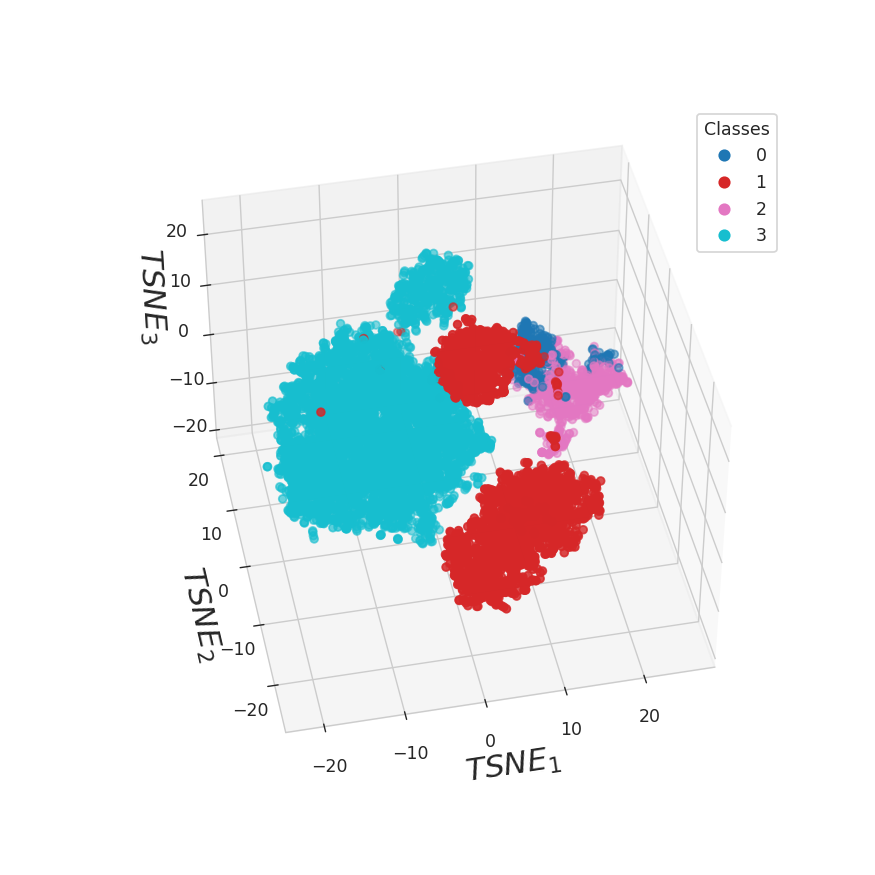

In [106]:
plot_3D(mbkm_labels)

In [ ]:
# не смогла запустить - умирало ядро
# ap_labels = AffinityPropagation().fit_predict(fc_data)
# print(f'AffinityPropagation silhouette_score: {round(silhouette_score(fc_data, ap_labels), 5)}')
# plot_2d(ap_labels)

Birch silhouette_score: 0.48937


<IPython.core.display.Javascript object>


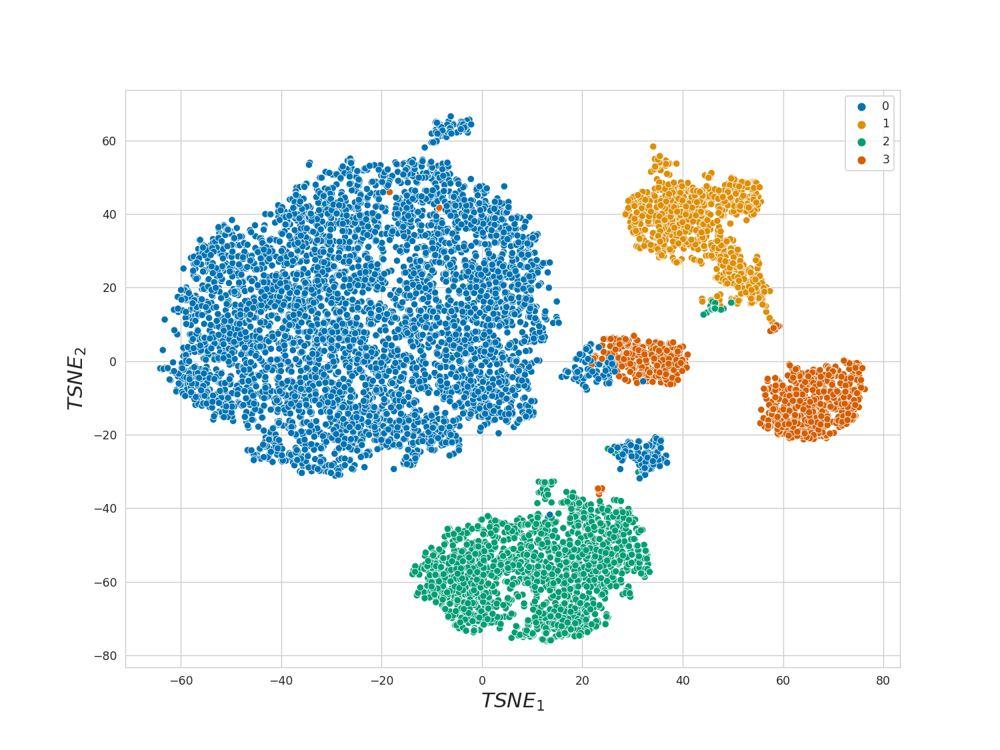

In [107]:
brc_labels = Birch(n_clusters=4, threshold=0.45).fit_predict(fc_data)
print(f'Birch silhouette_score: {round(silhouette_score(fc_data, brc_labels), 5)}')

plot_2d(brc_labels)

<IPython.core.display.Javascript object>


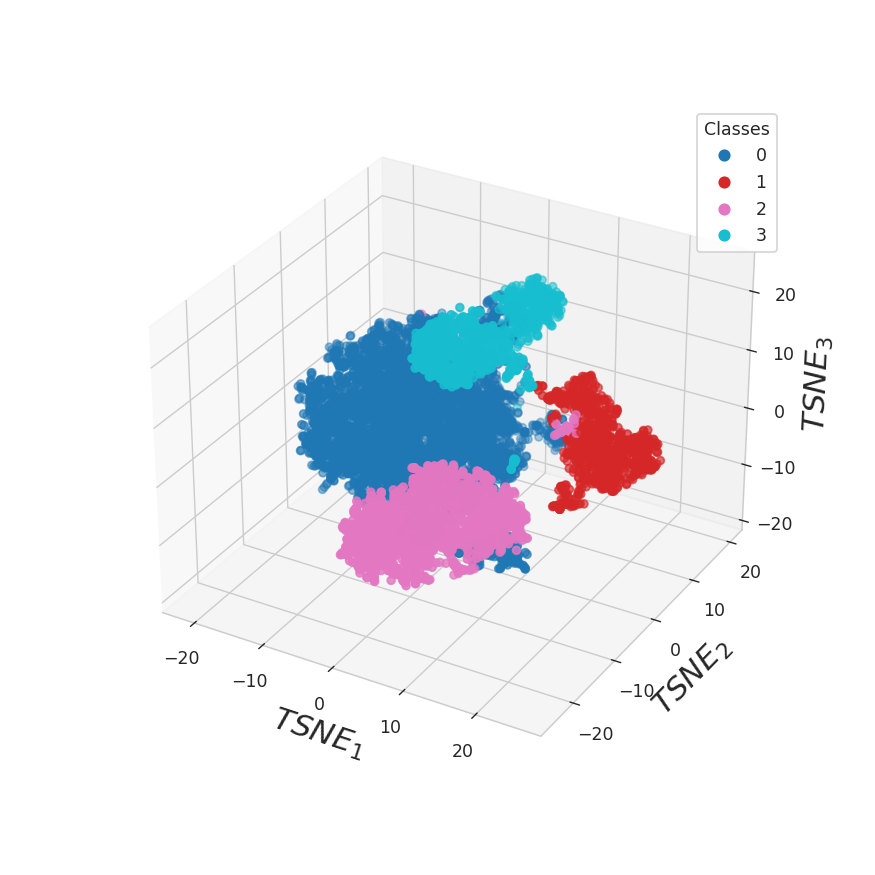

In [108]:
plot_3D(brc_labels)

Выбор по силуэту:

In [111]:
print(f'kmeans silhouette_score:\t\t{round(silhouette_score(fc_data, kmeans_labels, metric="euclidean", random_state=0), 5)}')
print(f'Agglomerative (e, w) silhouette_score:\t{round(silhouette_score(fc_data, ag_ew_labels, metric="euclidean", random_state=0), 5)}')
print(f'Agglomerative (c, a) silhouette_score:\t{round(silhouette_score(fc_data, ag_ca_labels, metric="cosine", random_state=0), 5)}')
print(f'DBSCAN (c, b) silhouette_score:\t\t{round(silhouette_score(fc_data, dbs_ca_labels, metric="chebyshev", random_state=0), 5)}')
print(f'DBSCAN (s, a) silhouette_score:\t\t{round(silhouette_score(fc_data, dbs_sa_labels, metric="sqeuclidean"), 5)}')
print(f'OPTICS silhouette_score:\t\t{round(silhouette_score(fc_data, opt_labels), 5)}')
print(f'SpectralClustering silhouette_score:\t{round(silhouette_score(fc_data, sc_labels), 5)}')
print(f'MiniBatchKMeans silhouette_score:\t{round(silhouette_score(fc_data, mbkm_labels), 5)}')
print(f'Birch silhouette_score:\t\t\t{round(silhouette_score(fc_data, brc_labels), 5)}')

kmeans silhouette_score:		0.51107
Agglomerative (e, w) silhouette_score:	0.48086
Agglomerative (c, a) silhouette_score:	0.61986
DBSCAN (c, b) silhouette_score:		0.38205
DBSCAN (s, a) silhouette_score:		0.65771
OPTICS silhouette_score:		0.15533
SpectralClustering silhouette_score:	0.50603
MiniBatchKMeans silhouette_score:	0.43278
Birch silhouette_score:			0.48937


Если смотреть только на силуэт, то лучший из использованных методов - DBSCAN (s, a). Однако, если сравнить график тсне с метками, то он несколько уступает Agglomerative (c, a), у которого слуэт немного ниже. Для дальнейшей работы буду использовать Agglomerative (c, a).

<IPython.core.display.Javascript object>


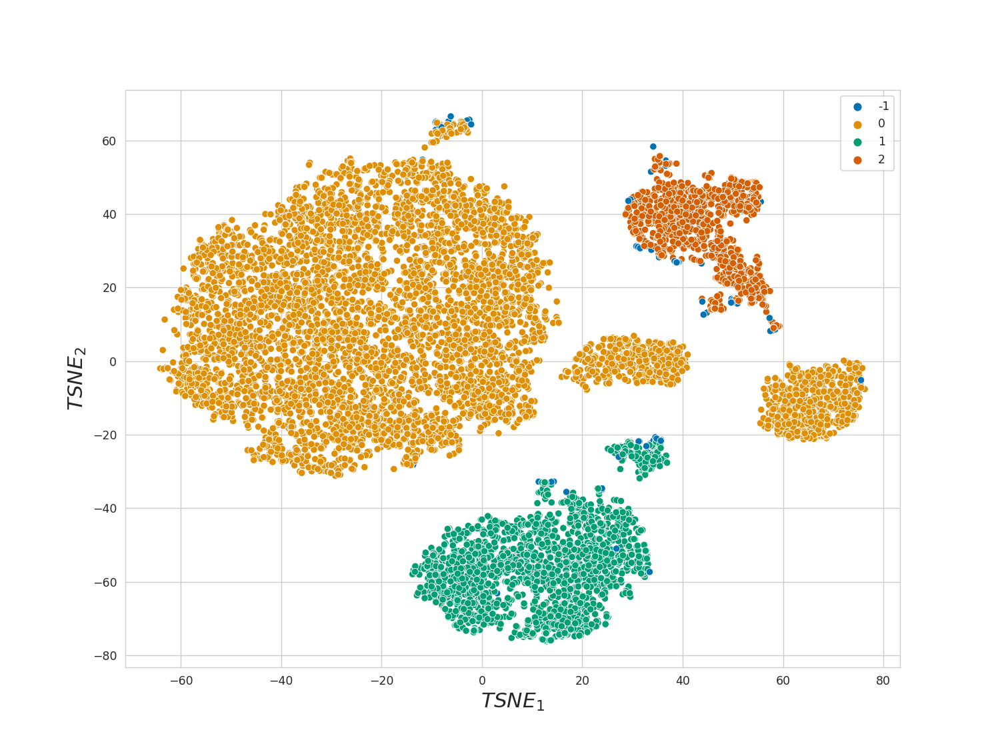

In [113]:
plot_2d(dbs_sa_labels)

<IPython.core.display.Javascript object>


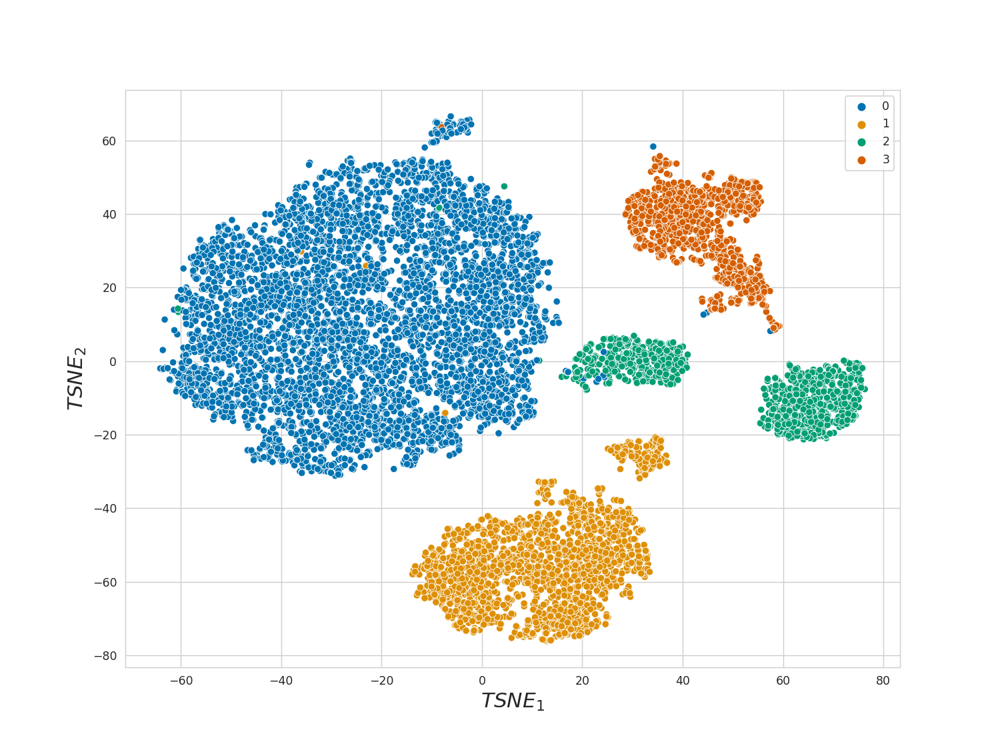

In [114]:
plot_2d(ag_ca_labels)

Удалось ли вам получить ситуацию, где отдельные группы точек покрашены в один цвет?

Да, при использовании SpectralClustering (несколько синих точек всё же попали в зеленые). -- Будем использовать этот алгоритм как предпочтительный (не смотря на более низкий силуэт).

<IPython.core.display.Javascript object>


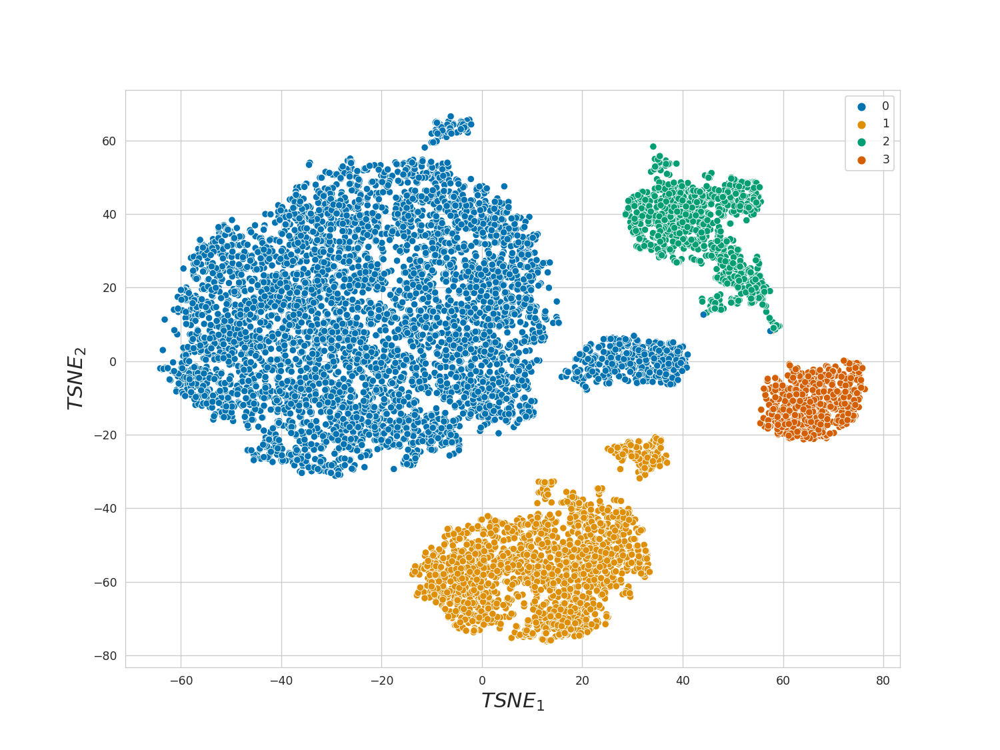

In [116]:
plot_2d(sc_labels)

#### 3.3. Аннотация клеточных типов

4 балла

Теперь когда мы подобрали хороший алгоритм кластеризации, можно аннотировать наши клетки. Для этого мы нарисуем t-SNE и покрасим точки в зависимости от интенсивности экспрессии поверхностных маркеров. В датасете присутствуют следующие типы клеток:

* B_cells
* T_cells
* Monocytes
* Other cells

Вам нужно будет выяснить, какие клетки экспрессируют определенные маркеры и присвоить каждому кластеру один из типов клеток.

Для начала нарисуем все это безобразие:

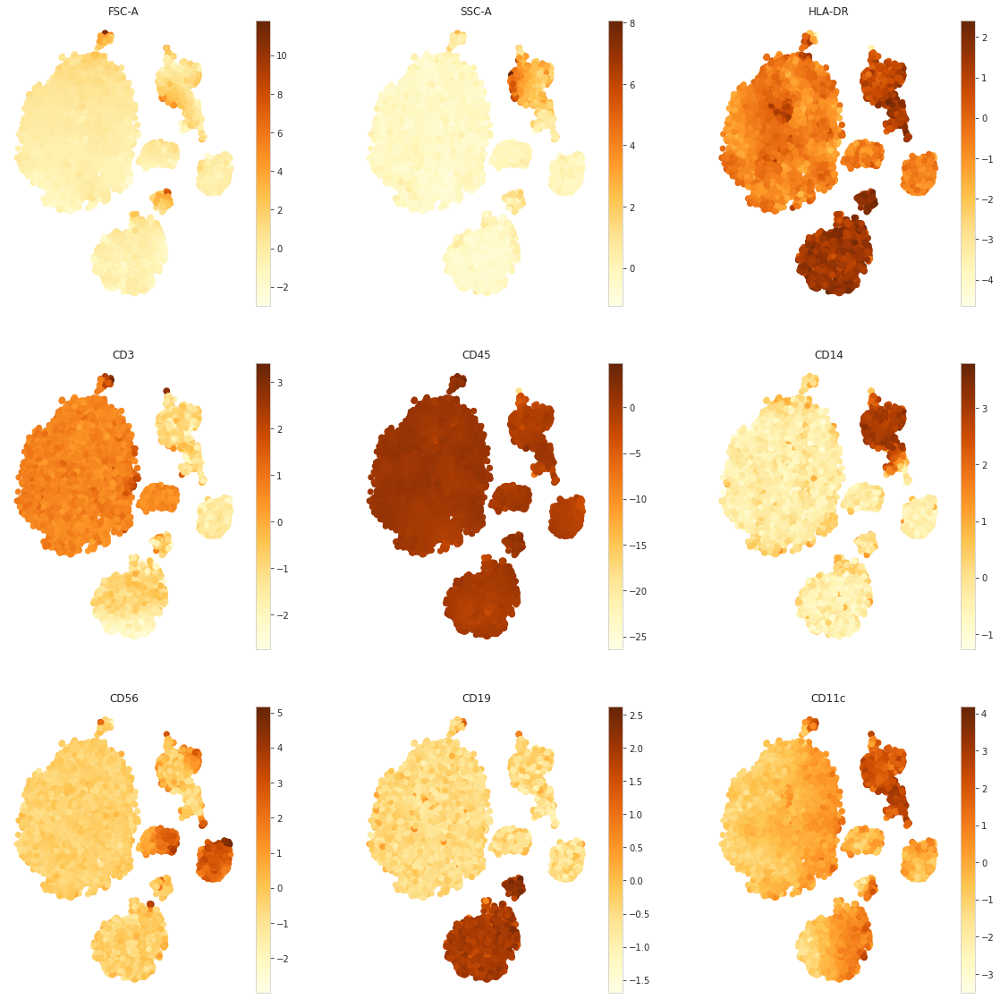

In [347]:
# Результаты t-SNE уже есть в переменной tsne_res
fig, axes = plt.subplots(3, 3, figsize=(20, 20))
for col, ax in zip(fc_data.columns, axes.ravel()):
    scatter = ax.scatter(tsne_res[:, 0], tsne_res[:, 1], 
                         c=fc_data[col], cmap="YlOrBr")
    fig.colorbar(scatter, ax=ax)
    ax.set_title(col)
    ax.grid(False)
    ax.axis("off")

Дальше дело за вами, нужно определить клеточный тип для каждого кластера и записать их как значения в словаре:

#### При использовании Agglomerative (c, a)

In [25]:
cell_type_cluster_map_A = {0: "T_cells", 
                           1: "B_cells", 
                           2: "Other cells", 
                           3: "Monocytes"}

In [26]:
A_clustering = AgglomerativeClustering(n_clusters=4, affinity='cosine', linkage='average').fit(fc_data)

In [27]:
labeled_fc_data_A = bfc_data.assign(Population=A_clustering.labels_)
labeled_fc_data_A["Population"] = labeled_fc_data_A["Population"].map(cell_type_cluster_map_A)

Посчитайте, как распределены типы клеток:

In [28]:
labeled_fc_data_A.Population.value_counts()

T_cells        5774
B_cells        2038
Monocytes      1098
Other cells    1089
Name: Population, dtype: int64

#### При использовании SpectralClustering (предпочтительный вариант)

In [22]:
cell_type_cluster_map_S = {0: "T_cells", 
                           1: "B_cells", 
                           2: "Monocytes", 
                           3: "Other cells"}

In [23]:
S_clustering = SpectralClustering(n_clusters=4, n_jobs=3, affinity='nearest_neighbors').fit(fc_data)

In [24]:
labeled_fc_data_S = bfc_data.assign(Population=S_clustering.labels_)
labeled_fc_data_S["Population"] = labeled_fc_data_S["Population"].map(cell_type_cluster_map_S)

In [29]:
labeled_fc_data_S.Population.value_counts()

T_cells        6225
B_cells        2035
Monocytes      1102
Other cells     637
Name: Population, dtype: int64

Сохраните ваши результаты в csv файл, мы сравним их с правильными ответами по метрике `f1_score(average="macro")`, которая хорошо подходит, даже если классы не сбалансированы.

In [30]:
# вариант с Agglomerative Clustering
labeled_fc_data_A.to_csv('../data_folder/results_Agglomerative.scv')

In [31]:
# вариант с SpectralClustering
labeled_fc_data_S.to_csv('../data_folder/results_Spectral.scv')

#### 3.4. Автоматическая аннотация

**дополнительные** 5 баллов

Это задание является дополнительным. Вам нужно построить классификатор клеточных типов на основе размеченных вами данных. Пока что мы прошли не так много разных классификаторов, но уже есть из чего выбирать.

Оцените качество полученной модели при помощи `f1_score(average="macro")`. Попробуйте его улучшить, каким-то образом поработав с дисбалансом классов ([помощь](https://elitedatascience.com/imbalanced-classes)).

In [35]:
from sklearn.utils import resample

In [44]:
df_T = labeled_fc_data_S[labeled_fc_data_S.Population=='T_cells']
df_B = labeled_fc_data_S[labeled_fc_data_S.Population=='B_cells']
df_M = labeled_fc_data_S[labeled_fc_data_S.Population=='Monocytes']
df_O = labeled_fc_data_S[labeled_fc_data_S.Population=='Other cells']
 
df_B_upsampled = resample(df_B, replace=True, n_samples=6225, random_state=123)
df_M_upsampled = resample(df_M, replace=True, n_samples=6225, random_state=123)
df_O_upsampled = resample(df_O, replace=True, n_samples=6225, random_state=123)

df_upsampled = pd.concat([df_T, df_B_upsampled, df_M_upsampled, df_O_upsampled])
 
df_upsampled.Population.value_counts()


T_cells        6225
B_cells        6225
Monocytes      6225
Other cells    6225
Name: Population, dtype: int64

In [45]:
SX = df_upsampled.iloc[:,:-1].values
SX = pd.DataFrame(SX, columns=df_upsampled.columns[:-1])
Sy = df_upsampled['Population']

In [46]:
X_train, X_test, y_train, y_test = train_test_split(SX, Sy, test_size=0.20, random_state=SEED)

In [47]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

###### kNN

In [67]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import f1_score
from sklearn.model_selection import GridSearchCV

In [68]:
def find_best_k(X_train, y_train, X_test, y_test, params, metric):
    train_metrics = []
    test_metrics = []
    
    for k in params:
        find_knn_classifier = KNeighborsClassifier(n_neighbors=k)
        find_knn_classifier.fit(X_train, y_train)
        
        y_train_pred = find_knn_classifier.predict(X_train)
        y_test_pred = find_knn_classifier.predict(X_test)

        train_metrics.append(metric(y_train, y_train_pred, average="macro"))
        test_metrics.append(metric(y_test, y_test_pred, average="macro"))
    
    return train_metrics, test_metrics

In [70]:
params = list(range(1, 200, 5))
train_metrics, test_metrics = find_best_k(X_train, y_train, 
                                          X_test, y_test, 
                                          params, f1_score)

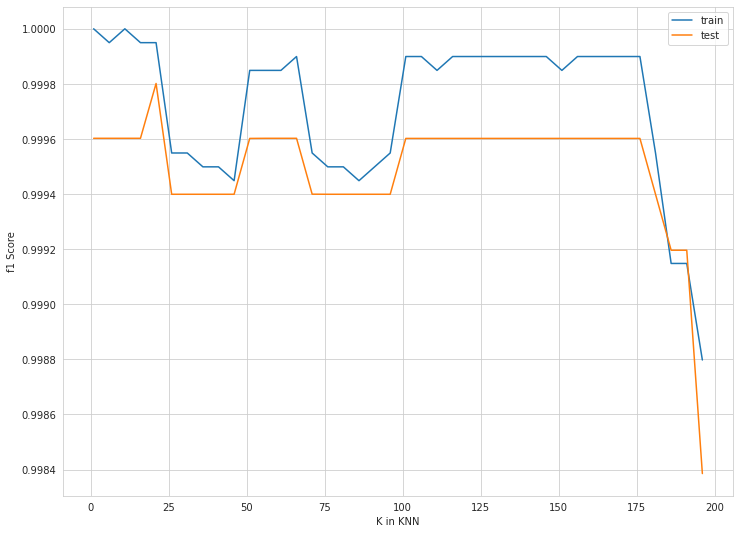

In [64]:
plt.figure()
plt.plot(params, train_metrics, label="train")
plt.plot(params, test_metrics, label="test")
plt.legend()
plt.xlabel("K in KNN")
plt.ylabel("f1 Score");

In [ ]:
k_range = list(range(2, 50))
weight_options = ["uniform", "distance"]
metric = ['euclidean', 'manhattan', 'chebyshev']

param_grid = dict(n_neighbors = k_range, weights = weight_options, metric=metric)

neigh = KNeighborsClassifier()

clf = GridSearchCV(neigh, param_grid, cv = 10, scoring = 'f1_macro')
clf.fit(X_train, y_train)

best_knn = clf.best_estimator_

print (clf.best_score_)
print (clf.best_params_)
print (clf.best_estimator_)

In [75]:
knn_classifier = KNeighborsClassifier(n_neighbors=20)
knn_classifier.fit(X_train, y_train)

y_pred = best_knn.predict(X_test)

print(f'f1_score: {f1_score(y_test, y_pred, average="macro")}')

f1_score: 0.9996024549917853


###### RF

### Задание 4. Любимое место

дополнительно 0.5 балла

Расскажите о вашем любимом месте, куда бы вы хотели съездить этой весной, если вы уже там бывали, то прикрепите фотографию)

### Therapy time

Напишите здесь ваши впечатления о задании: было ли интересно, было ли слишком легко или наоборот сложно и тд. Также сюда можно написать свои идеи по улучшению заданий, а также предложить данные, на основе которых вы бы хотели построить следующие дз.

**Ваши мысли:**